# Design of comparative analysis

In this notebook we benchmark the ability to recover query-specific cell phenotypes using 3 alternative designs for comparative analysis

- Atlas reference (AR design): mapping perturbed cells to an all-encompassing atlas dataset
- Control reference (CR design): mapping perturbed cells to a matched control dataset
- Atlas and Control reference (ACR design): mapping perturbed and control cells to an all-encompassing atlas dataset

We use 4 different metrics to assess the accuracy of query-specific cell detection:
- Differential abundance analysis with milo
- Uncertainty over labels, using KNN classifier as implemented in scArches
- Uncertainty over reconstructed gene expression profiles: ~ reconstruction error per cell after scArches


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import scanpy as sc 
import pandas as pd
import numpy as np
import milopy
import scipy

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

import oor_benchmark
import oor_benchmark.metrics.utils

sns.set_context('talk')
from matplotlib.pyplot import rc_context

In [3]:
figdir = '/home/jovyan/mount/gdrive/diff2atlas/figures/pbmc_design_comparison_v2/'
if not os.path.exists(figdir):
    os.mkdir(figdir)

In [4]:
## r2py setup
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)


In [5]:
%load_ext rpy2.ipython

In [6]:
%%R -i figdir
library(tidyverse)
library(patchwork)
library(ggrastr)

remove_x_axis <- function(){
  theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), axis.title.x = element_blank())  
}

remove_y_axis <- function(){
  theme(axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.title.y = element_blank())  
}

System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to create bus connection: Host is down


In [7]:
## Some utils

def _plot_nhood_sizes(adata, bins=50, **kwargs):
    plt.hist(np.array(adata.obsm['nhoods'].sum(0)).ravel(), bins=bins, **kwargs);
    plt.xlabel('# cells');plt.ylabel('# nhoods');
    
def get_nhood_adata(adata):
    return(adata.uns['nhood_adata'])

def get_cells_from_nhood(adata, i):
    return((adata.obsm['nhoods'][:,i].toarray() == 1).flatten())

def remove_x_axis(ax):
    ax.xaxis.set_major_locator(matplotlib.ticker.NullLocator());
    ax.set_xlabel('');

def remove_y_axis(ax):
    ax.yaxis.set_major_locator(matplotlib.ticker.NullLocator());
    ax.set_ylabel('');
    
def make_ct_label(label):
    return(' '.join(label.split('_')))

In [8]:
## Define color palette
pal = sns.color_palette('Paired').as_hex()
design_palette = {'ACR':pal[3], 'CR scArches':pal[7], 'AR':pal[9], 'CR scVI':pal[6]}
design_palette_df = pd.DataFrame(design_palette.values(), index =design_palette.keys() )
design_palette_df.columns = ['color']

In [9]:
%%R -i design_palette_df
design_palette <- setNames(design_palette_df$color, rownames(design_palette_df))

scale_color_design <- function(){
    scale_color_manual(values=design_palette, name='design')
}

scale_fill_design <- function(){
    scale_color_manual(values=design_palette, name='design')
}

In [10]:

short_pop_names = {
    "DC":'conventional_dendritic_cell', 
    "naive B":'naive_B_cell',
    "memory B":'memory_B_cell',
    "CM CD4+T":'central_memory_CD4_positive_alpha_beta_T_cell', 
    'plasmablast':'plasmablast',
    'platelet':'platelet', 
 "pDC":'plasmacytoid_dendritic_cell',
     "neutrophil":'neutrophil',
#     "cDC":'conventional_dendritic_cell',
 'naive CD4+T':'naive_thymus_derived_CD4_positive_alpha_beta_T_cell',
"classical monocyte":'classical_monocyte', 
    'CD14+ monocyte':'CD14_positive_monocyte',
 'erythrocyte':'erythrocyte',
       "naive CD8+T":'naive_thymus_derived_CD8_positive_alpha_beta_T_cell',
       "NK":'natural_killer_cell',
       "EM CD8+T":'effector_memory_CD8_positive_alpha_beta_T_cell',
       'MAIT':'mucosal_invariant_T_cell', 
 'CD14lo CD16hi monocyte':'CD14_low_CD16_positive_monocyte',
    "HPP":'hematopoietic_precursor_cell'
}

short_pop_names={v:k for k,v in short_pop_names.items()}

### Experiment set-up

See `submit_oor_design_v2.sh`

## Parse results 

In [11]:
outdir = '/lustre/scratch126/cellgen/team205/ed6/PBMC_CZI_integration_filtered/tmp/'
population_obs = 'cell_type'
batch_obs = 'dataset_id'

In [17]:
## Get OOR state population size
oor_state_size = {}
for d in [d for d in os.listdir(outdir) if d.endswith('_seed2022') and d.startswith('qPBMC_500cells_demo_perturb')]:
        if 'neutrophil' not in d:
            acr_adata = sc.read_h5ad(outdir + d +'/acr_design.h5ad', backed=True)
            ct = acr_adata.obs[acr_adata.obs['OOR_state']==1]['cell_type'].unique()[0]
            oor_state_size[ct] = acr_adata.obs['OOR_state'].sum()

oor_state_frac = {k:v/(500*(14+16)) for k,v in oor_state_size.items()}
oor_state_frac

oor_state_size

{'memory_B_cell': 398,
 'conventional_dendritic_cell': 108,
 'naive_B_cell': 601,
 'central_memory_CD4_positive_alpha_beta_T_cell': 1811,
 'plasmablast': 15,
 'platelet': 123,
 'plasmacytoid_dendritic_cell': 43,
 'naive_thymus_derived_CD4_positive_alpha_beta_T_cell': 779,
 'classical_monocyte': 391,
 'erythrocyte': 10,
 'naive_thymus_derived_CD8_positive_alpha_beta_T_cell': 396,
 'natural_killer_cell': 1067,
 'effector_memory_CD8_positive_alpha_beta_T_cell': 1436,
 'mucosal_invariant_T_cell': 203,
 'CD14_low_CD16_positive_monocyte': 124}

In [125]:
nhoods_res_df_all = pd.DataFrame()
tpr_res_df_all = pd.DataFrame()
for d in [d for d in os.listdir(outdir) if d.endswith('_seed2022') and d.startswith('qPBMC_500cells_demo_perturb')]:
    diff_method = 'milo'
    for embedding_method in ['scVI', 'scArches']:
        print(f'Reading {d}')
        nhoods_res_df = pd.read_csv(outdir + d + f'/nhoods_obs.{embedding_method}_{diff_method}.csv', index_col = 0)
        nhoods_res_df['emb_method'] = embedding_method
        nhoods_res_df_all = pd.concat([nhoods_res_df_all, nhoods_res_df])
        tpr_res_df = pd.read_csv(outdir + d + f'/TPR_res.{embedding_method}_{diff_method}.csv', index_col = 0)
        tpr_res_df['emb_method'] = embedding_method
        tpr_res_df_all = pd.concat([tpr_res_df_all, tpr_res_df])
#         except:
#             print('skipping')

Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typenaive_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typenaive_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typecentral_memory_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typecentral_memory_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2

In [126]:
nhoods_res_df_all = nhoods_res_df_all[nhoods_res_df_all.OOR_state_name != 'neutrophil']
tpr_res_df_all = tpr_res_df_all[tpr_res_df_all.OOR_state_name != 'neutrophil']

nhoods_res_df_all['perturb_pop_pl'] = [short_pop_names[x] for x in nhoods_res_df_all['OOR_state_name']]
tpr_res_df_all['perturb_pop_pl'] = [short_pop_names[x] for x in tpr_res_df_all['OOR_state_name']]

## Keep 4 designs
nhoods_res_df_all['design'] = np.where(nhoods_res_df_all['design'] == 'CR', nhoods_res_df_all['design'] + ' ' + nhoods_res_df_all['emb_method'], nhoods_res_df_all['design'])
tpr_res_df_all['design'] = np.where(tpr_res_df_all['design'] == 'CR', tpr_res_df_all['design'] + ' ' + tpr_res_df_all['emb_method'], tpr_res_df_all['design'])

nhoods_res_df_all = nhoods_res_df_all[nhoods_res_df_all['design'].isin(["ACR", 'AR', 'CR scVI', 'CR scArches'])].copy()
nhoods_res_df_all = nhoods_res_df_all[~((nhoods_res_df_all['design'] == 'ACR') & (nhoods_res_df_all['emb_method'] == 'scVI'))]
tpr_res_df_all = tpr_res_df_all[tpr_res_df_all['design'].isin(["ACR", 'AR', 'CR scVI', 'CR scArches'])].copy()
tpr_res_df_all = tpr_res_df_all[~((tpr_res_df_all['design'] == 'ACR') & (tpr_res_df_all['emb_method'] == 'scVI'))]

## Plot OOR fraction vs logFC

In [28]:
%%R -i nhoods_res_df_all
head(nhoods_res_df_all)

                                             index_cell kth_distance
1 10_1038_s41591_021_01329_2-CTTAGGAGTTAAAGTG-MH8919178     1.633824
2 10_1038_s41591_021_01329_2-GTCTTCGTCCTGCCAT-MH8919178     1.597826
3 10_1038_s41591_021_01329_2-CAACCAATCTATCGCC-MH8919178     1.463025
4 10_1038_s41591_021_01329_2-CTCAGAAAGGATGCGT-MH8919178     1.621413
5 10_1038_s41591_021_01329_2-CACTCCAAGGATGGTC-MH8919178     1.526698
6 10_1038_s41591_021_01329_2-TGAGAGGAGACAGACC-MH8919178     1.568583
                                     nhood_annotation nhood_annotation_frac
1       central_memory_CD4_positive_alpha_beta_T_cell             0.8269231
2       central_memory_CD4_positive_alpha_beta_T_cell             0.9393939
3                                  classical_monocyte             0.9955157
4                                 natural_killer_cell             0.9238095
5                                  classical_monocyte             0.9858156
6 naive_thymus_derived_CD8_positive_alpha_beta_T_cell        

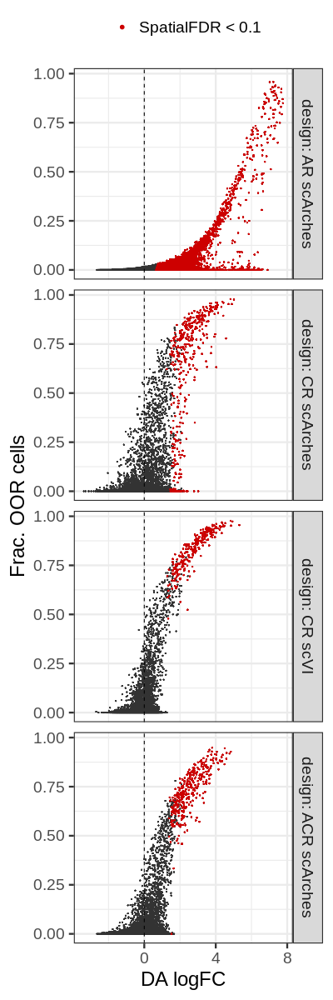

In [58]:
%%R -h 1200 -w 400 -i figdir
nhoods_res_df_all %>%
    mutate(design=factor(design, levels=c('AR scArches', 'CR scArches', 'CR scVI','ACR scArches'))) %>%
    ggplot(aes(OOR_score, frac_OOR_cells)) +
    rasterise(geom_point(size=0.3, color='grey20'), dpi=300) +
    rasterise(geom_point(data=. %>% filter(OOR_signif == 1), aes(color='SpatialFDR < 0.1'),
               size=0.4), dpi=300) +
    facet_grid(design~., labeller='label_both') +
    guides(color=guide_legend(title='', override.aes = list(size=2))) +
    theme_bw(base_size=24) +
    scale_color_manual(values = c(`SpatialFDR < 0.1` = 'red3')) +
    geom_vline(xintercept=0, linetype=2) +
    xlab('DA logFC') + ylab('Frac. OOR cells') +
    theme(legend.position='top') +
    ggsave(paste0(figdir, 'fracVSlogFC_all_ggplot.png'), width=6, height=12) +
    ggsave(paste0(figdir, 'fracVSlogFC_all_ggplot.pdf'), width=6, height=12)

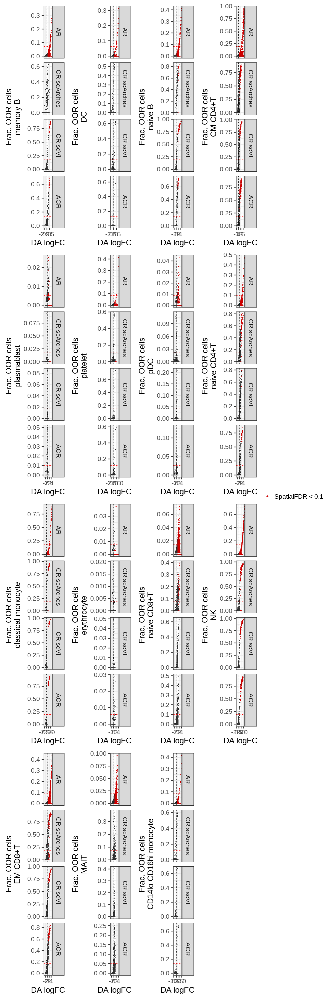

In [50]:
%%R -w 1000 -h 3000
pl_ls <- lapply(unique(nhoods_res_df_all$perturb_pop_pl), function(p){
    nhoods_res_df_all %>%
    mutate(design=factor(design, levels=c('AR', 'CR scArches', 'CR scVI','ACR'))) %>%
    group_by(OOR_state_name, design) %>%
    mutate(frac_thresh= max(frac_OOR_cells/100)*20) %>%
    ungroup() %>%
    filter(perturb_pop_pl %in% c(p)) %>%
    ggplot(aes(OOR_score, frac_OOR_cells)) +
    rasterise(geom_point(size=0.3, color='grey20'), dpi=300) +
    rasterise(geom_point(data=. %>% filter(OOR_signif == 1), aes(color='SpatialFDR < 0.1'),
               size=0.4), dpi=300) +
    facet_grid(design~., scales='free_y') +
    guides(color=guide_legend(title='', override.aes = list(size=2))) +
    theme_bw(base_size=24) +
    scale_color_manual(values = c(`SpatialFDR < 0.1` = 'red3')) +
    geom_vline(xintercept=0, linetype=2) +
    geom_hline(aes(yintercept=frac_thresh), linetype=2, color='red') +
    xlab('DA logFC') + ylab(paste0('Frac. OOR cells\n', p)) +
    theme(legend.position='top') 
    })

(wrap_plots(pl_ls, ncol=4, guides='collect') & {theme(legend.position='right') }) +
    ggsave(paste0(figdir, 'fracVSlogFC_cts_ggplot.png'), width=24, height=32) +
    ggsave(paste0(figdir, 'fracVSlogFC_cts_ggplot.pdf'), width=24, height=32) +
    ggsave(paste0("/home/jovyan/mount/gdrive/diff2atlas/figure_panels/Supplementary_v2/Suppl_Figure_fracVSlogFC.pdf"), width=24, height=32) +
    ggsave(paste0("/home/jovyan/mount/gdrive/diff2atlas/figure_panels/Supplementary_v2/Suppl_Figure_fracVSlogFC.png"), width=24, height=32) 


## Check fraction distribution compared to size of population

In [127]:
nhoods_res_df_all['OOR_state_ncells'] = [oor_state_size[x] if x in oor_state_size.keys() else np.nan for x in nhoods_res_df_all['OOR_state_name']]
tpr_res_df_all['OOR_state_ncells'] = [oor_state_size[x] if x in oor_state_size.keys() else np.nan for x in tpr_res_df_all['OOR_state_name']]

In [94]:
%%R -i tpr_res_df_all
head(tpr_res_df_all)

  TP   FP  FN    TN       TPR        FPR       FDR      design
1 18    0  15   990 0.5454545 0.00000000 0.0000000     CR scVI
2 17    0  48   875 0.2615385 0.00000000 0.0000000         ACR
3  0    0 103   909 0.0000000 0.00000000 0.0000000 CR scArches
4 38 3718   0 43482 1.0000000 0.07877119 0.9898829          AR
5  0    0  13   978 0.0000000 0.00000000 0.0000000     CR scVI
6  0    0   8   972 0.0000000 0.00000000 0.0000000         ACR
               OOR_state_name emb_method perturb_pop_pl OOR_state_ncells
1               memory_B_cell       scVI       memory B              398
2               memory_B_cell   scArches       memory B              398
3               memory_B_cell   scArches       memory B              398
4               memory_B_cell   scArches       memory B              398
5 conventional_dendritic_cell       scVI             DC              108
6 conventional_dendritic_cell   scArches             DC              108


In [95]:
tpr_res_df_all = tpr_res_df_all[~((tpr_res_df_all.emb_method == 'scVI') & (tpr_res_df_all.design == 'AR'))]

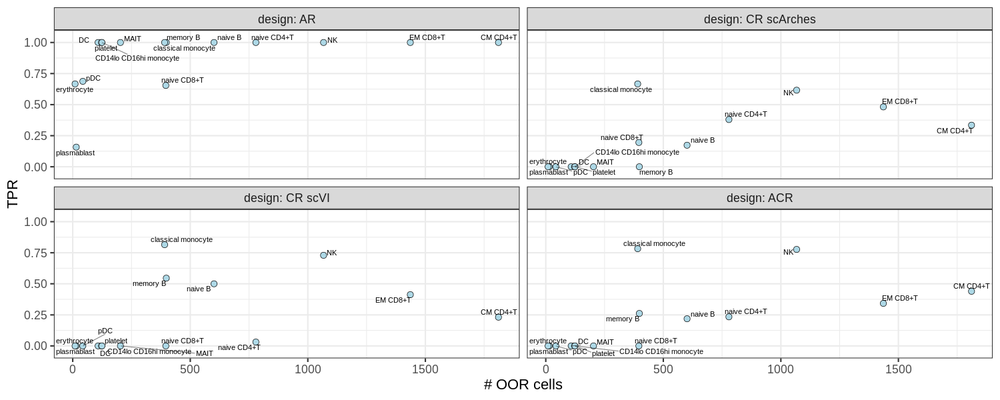

In [67]:
%%R -w 1500 -h 600 -i figdir
tpr_res_df_all %>%
#     filter(design=='ACR') %>%
    mutate(design = factor(design, c('AR', "CR scArches", "CR scVI", 'ACR'))) %>%
    ggplot(aes(OOR_state_ncells, TPR)) +
    geom_point(size=4, shape=21, fill='lightblue') +
    ggrepel::geom_text_repel(aes(label=perturb_pop_pl), max.overlaps = Inf, force=2, segment.alpha=0.5) +
    facet_wrap(design~., labeller='label_both', ncol=2) +
    xlab('# OOR cells') +
    theme_bw(base_size=22) +
    scale_y_continuous(expand = expansion(mult = 0.1)) +
    ggsave(paste0(figdir, "OOR_ncells_vs_TPR.pdf"), width=13, height=8) +
    ggsave(paste0(figdir, "OOR_ncells_vs_TPR.png"), width=13, height=8) +
    ggsave(paste0("/home/jovyan/mount/gdrive/diff2atlas/figure_panels/Supplementary_v2/Suppl_Figure_ncellsvsTPR.pdf"), width=13, height=8) +
    ggsave(paste0("/home/jovyan/mount/gdrive/diff2atlas/figure_panels/Supplementary_v2/Suppl_Figure_ncellsvsTPR.png"), width=13, height=8)

## Plot TPR/FPR/FDR

In [128]:
nhoods_res_df_all['OOR_state_ncells'] = [oor_state_size[x] if x in oor_state_size.keys() else np.nan for x in nhoods_res_df_all['OOR_state_name']]
tpr_res_df_all['OOR_state_ncells'] = [oor_state_size[x] if x in oor_state_size.keys() else np.nan for x in tpr_res_df_all['OOR_state_name']]

In [97]:
no_sensitivity = tpr_res_df_all[~tpr_res_df_all.design.str.startswith("AR")].groupby(["OOR_state_name"]).max()['TPR']
no_sensitivity = no_sensitivity.index[no_sensitivity == 0]
tpr_res_df_all = tpr_res_df_all[~tpr_res_df_all['OOR_state_name'].isin(no_sensitivity)]

In [98]:
no_sensitivity

Index(['CD14_low_CD16_positive_monocyte', 'conventional_dendritic_cell',
       'erythrocyte', 'mucosal_invariant_T_cell', 'plasmablast',
       'plasmacytoid_dendritic_cell', 'platelet'],
      dtype='object', name='OOR_state_name')

In [99]:
%%R -i tpr_res_df_all -w 1000 -h 400 

pl1 <- tpr_res_df_all %>%
    mutate(design=factor(design, levels=c('AR', 'CR scArches', 'CR scVI','ACR'))) %>%
    pivot_longer(cols=c("TPR", "FPR", "FDR"), names_to='metric') %>%
    ggplot(aes(design, value, color=design)) +
    geom_boxplot() +
    geom_jitter(size=3, width=0.05) +
    geom_line(aes(group=OOR_state_name), color='grey', alpha=0.6) +
    facet_wrap(metric~.) +
    scale_color_manual(values=design_palette) +
    theme_bw(base_size=24) +
    ylab("") +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5))


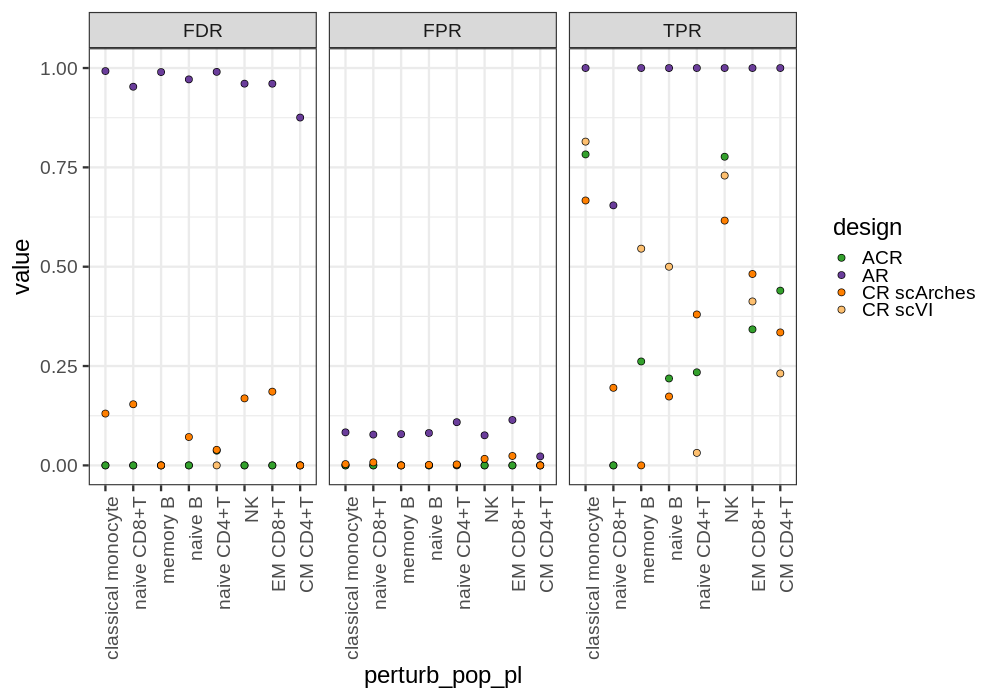

In [100]:
%%R -i tpr_res_df_all -w 1000 -h 700 -i design_palette_df

# design_palette = setNames(design_palette_df$color, rownames(design_palette_df))

tpr_res_df_all %>%
#     filter(design=='ACR') %>%
    arrange(OOR_state_ncells) %>%
#     mutate(design = factor(design, levels=c('AR', "CR", 'ACR'))) %>%
    mutate(perturb_pop_pl = factor(perturb_pop_pl, levels=unique(perturb_pop_pl))) %>%
    pivot_longer(cols=c("TPR", "FPR", "FDR"), names_to='metric') %>%
    ggplot(aes(perturb_pop_pl, value, fill=design)) +
    geom_point(shape=21, size=3) +
    facet_wrap(metric~.) +
    scale_fill_manual(values=design_palette) +
    theme_bw(base_size=24) +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=1))


## Plot AUPRC

In [118]:
auprc_res_df_all = pd.DataFrame()
for d in [d for d in os.listdir(outdir) if d.endswith('_seed2022') and d.startswith('qPBMC_500cells_demo_perturb')]:
    diff_method = 'milo'
    if 'neutrophil' not in d:
        for embedding_method in ['scVI', 'scArches']:
            print(f'Reading {d}')
            print(f'Reading {d}')
            auprc_res_df = pd.read_csv(outdir + d + f'/AUPRC_res.{embedding_method}_{diff_method}.csv', index_col = 0)
            auprc_res_df['emb_method'] = embedding_method
            auprc_res_df_all = pd.concat([auprc_res_df_all, auprc_res_df])


Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_d

In [103]:
no_sensitivity

Index(['CD14_low_CD16_positive_monocyte', 'conventional_dendritic_cell',
       'erythrocyte', 'mucosal_invariant_T_cell', 'plasmablast',
       'plasmacytoid_dendritic_cell', 'platelet'],
      dtype='object', name='OOR_state_name')

In [119]:
auprc_res_df = auprc_res_df_all[['OOR_state_name', 'design', 'AUPRC', 'no_skill_thresh', 'emb_method']].drop_duplicates()
# auprc_res_df = auprc_res_df[~auprc_res_df['OOR_state_name'].isin(no_sensitivity)]

In [120]:
## Keep 4 designs
auprc_res_df['design'] = np.where(auprc_res_df['design']=='CR', auprc_res_df['design'] + ' ' + auprc_res_df['emb_method'], auprc_res_df['design'])
auprc_res_df = auprc_res_df[auprc_res_df['design'].isin(["ACR", 'AR', 'CR scVI', 'CR scArches'])].copy()
auprc_res_df = auprc_res_df[~((auprc_res_df['design'] == 'ACR') & (auprc_res_df['emb_method'] == 'scVI'))]

In [121]:
auprc_res_df['OOR_state_ncells'] = [oor_state_size[x] if x in oor_state_size.keys() else np.nan for x in auprc_res_df['OOR_state_name']]

In [122]:
%%R -i auprc_res_df
head(auprc_res_df)

               OOR_state_name      design     AUPRC no_skill_thresh emb_method
1               memory_B_cell     CR scVI 0.8227029    0.0322580645       scVI
2               memory_B_cell         ACR 0.7737205    0.0691489362   scArches
3               memory_B_cell CR scArches 0.1681823    0.1017786561   scArches
4               memory_B_cell          AR 0.5673362    0.0008044371   scArches
5 conventional_dendritic_cell     CR scVI 0.4698171    0.0131180626       scVI
6 conventional_dendritic_cell         ACR 0.2889891    0.0081632653   scArches
  OOR_state_ncells
1              398
2              398
3              398
4              398
5              108
6              108


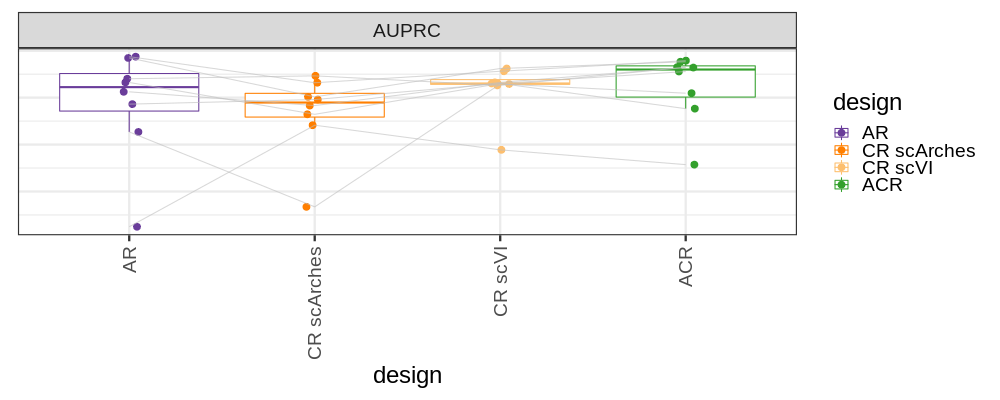

In [110]:
%%R -w 1000 -h 400 -i design_palette_df

pl2 <- auprc_res_df %>%
    mutate(design = factor(design, levels=c('AR', "CR scArches", "CR scVI", 'ACR'))) %>%
    pivot_longer(cols=c("AUPRC"), names_to='metric') %>%
    ggplot(aes(design, value, color=design)) +
    geom_boxplot(outlier.alpha=0) +
    geom_jitter(size=3, width=0.05) +
    geom_line(aes(group=OOR_state_name), color='grey', alpha=0.6) +
    facet_wrap(metric~.) +
    scale_color_manual(values=design_palette) +
    theme_bw(base_size=24) +
    remove_y_axis() +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5)) 
    
pl2 

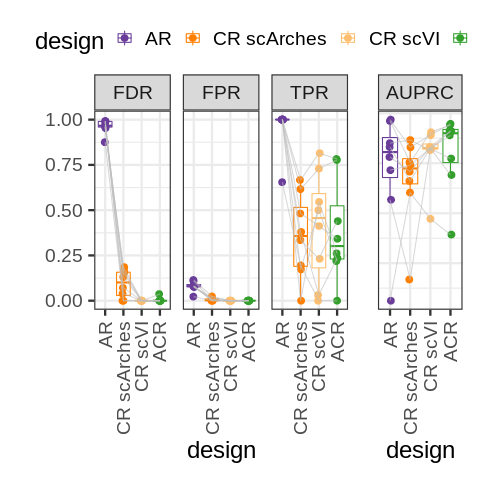

In [111]:
%%R
fig <- (pl1 + pl2) + plot_layout(widths=c(3,1), guides='collect') & 
    {theme(legend.position='top', legend.justification='right')} 

fig +
    ggsave(paste0(figdir, 'metrics_boxplot_design.png'), width=15, height=6) +
    ggsave(paste0(figdir, 'metrics_boxplot_design.pdf'), width=15, height=6)

In [138]:
auprc_res_df['perturb_pop_pl'] = [short_pop_names[x] for x in auprc_res_df['OOR_state_name']]

In [144]:
%%R -i auprc_res_df -w 700 -h 900 -i design_palette_df

# design_palette = setNames(design_palette_df$color, rownames(design_palette_df))

p2 <- auprc_res_df %>%
    arrange(OOR_state_ncells) %>%
    filter(design != 'AR') %>%
    mutate(perturb_pop_pl = factor(perturb_pop_pl, levels=unique(perturb_pop_pl))) %>%
#     pivot_longer(cols=c("TPR", "FPR", "FDR"), names_to='metric') %>%
    ggplot(aes(perturb_pop_pl, AUPRC, fill=design)) +
    geom_point(shape=21, size=4) +
    scale_fill_manual(values=design_palette) +
    theme_bw(base_size=24) +
    xlab('--- OOR state size --->') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=1))

In [145]:
%%R -i tpr_res_df_all -w 700 -h 900 -i design_palette_df

# design_palette = setNames(design_palette_df$color, rownames(design_palette_df))

p1 <- tpr_res_df_all %>%
    arrange(OOR_state_ncells) %>%
    filter(design != 'AR') %>%
    mutate(perturb_pop_pl = factor(perturb_pop_pl, levels=unique(perturb_pop_pl))) %>%
#     pivot_longer(cols=c("TPR", "FPR", "FDR"), names_to='metric') %>%
    ggplot(aes(perturb_pop_pl, TPR, fill=design)) +
    geom_point(shape=21, size=4) +
    scale_fill_manual(values=design_palette) +
    theme_bw(base_size=24) +
    xlab('--- OOR state size --->') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=1))

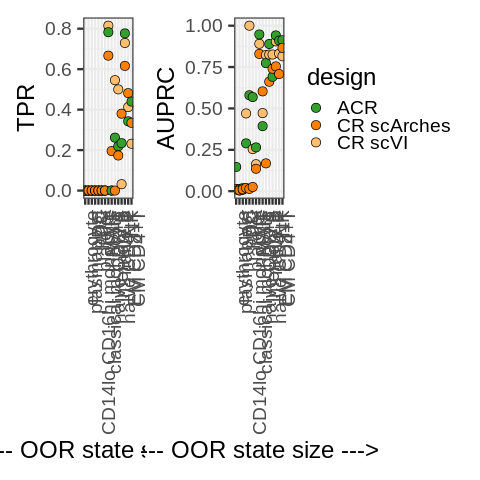

In [147]:
%%R
(p1 + p2) + 
plot_layout(guides='collect') +
ggsave(paste0(figdir, 'rebuttal_figure_size.png'), width=14, height=8)

## Check fraction distribution compared to size of population

In [34]:
nhoods_res_df_all['OOR_state_ncells'] = [oor_state_size[x] if x in oor_state_size.keys() else np.nan for x in nhoods_res_df_all['OOR_state_name']]
tpr_res_df_all['OOR_state_ncells'] = [oor_state_size[x] if x in oor_state_size.keys() else np.nan for x in tpr_res_df_all['OOR_state_name']]

In [35]:
# max_frac = nhoods_res_df_all.groupby('OOR_state_name').max()[['frac_OOR_cells']]
max_frac = nhoods_res_df_all[nhoods_res_df_all['OOR_state_group'] == 1].groupby(['OOR_state_name', 'design']).max()[['frac_OOR_cells']]
max_frac['OOR_state_ncells'] = [oor_state_size[x] if x in oor_state_size.keys() else np.nan for x in max_frac.index]
max_frac = max_frac.reset_index()

max_frac = pd.merge(max_frac, tpr_res_df_all)
max_frac

/tmp/ipykernel_595/1440362520.py:2: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  max_frac = nhoods_res_df_all[nhoods_res_df_all['OOR_state_group'] == 1].groupby(['OOR_state_name', 'design']).max()[['frac_OOR_cells']]


,OOR_state_name,design,frac_OOR_cells,OOR_state_ncells,TP,FP,FN,TN,TPR,FPR,FDR,emb_method,perturb_pop_pl


In [36]:
%%R -i tpr_res_df_all
head(tpr_res_df_all)

  TP   FP  FN    TN       TPR        FPR       FDR      design OOR_state_name
1 18    0  15   990 0.5454545 0.00000000 0.0000000     CR scVI  memory_B_cell
2 17    0  48   875 0.2615385 0.00000000 0.0000000         ACR  memory_B_cell
3  0    0 103   909 0.0000000 0.00000000 0.0000000 CR scArches  memory_B_cell
4 38 3718   0 43482 1.0000000 0.07877119 0.9898829          AR  memory_B_cell
5 32    0  32   885 0.5000000 0.00000000 0.0000000     CR scVI   naive_B_cell
6 21    0  75   852 0.2187500 0.00000000 0.0000000         ACR   naive_B_cell
  emb_method perturb_pop_pl OOR_state_ncells
1       scVI       memory B              398
2   scArches       memory B              398
3   scArches       memory B              398
4   scArches       memory B              398
5       scVI        naive B              601
6   scArches        naive B              601


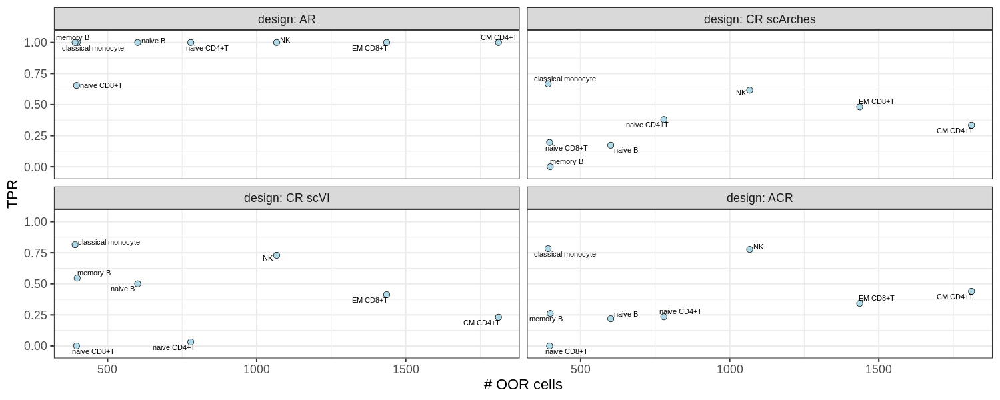

In [39]:
%%R -w 1500 -h 600 -i figdir
tpr_res_df_all %>%
#     filter(design=='ACR') %>%
    mutate(design = factor(design, c('AR', "CR scArches", "CR scVI", 'ACR'))) %>%
    ggplot(aes(OOR_state_ncells, TPR)) +
    geom_point(size=4, shape=21, fill='lightblue') +
    ggrepel::geom_text_repel(aes(label=perturb_pop_pl), max.overlaps = Inf, force=2, segment.alpha=0.5) +
    facet_wrap(design~., labeller='label_both', ncol=2) +
    xlab('# OOR cells') +
    theme_bw(base_size=22) +
    scale_y_continuous(expand = expansion(mult = 0.1)) +
    ggsave(paste0(figdir, "OOR_ncells_vs_TPR.pdf"), width=10, height=5) +
    ggsave(paste0(figdir, "OOR_ncells_vs_TPR.png"), width=10, height=5)

## Check naive CD8T

In [134]:
tpr_res_df_all[tpr_res_df_all['OOR_state_name'] == 'naive_thymus_derived_CD8_positive_alpha_beta_T_cell']

,TP,FP,FN,TN,TPR,FPR,FDR,design,OOR_state_name,OOR_state_ncells,perturb_pop_pl
0,0,5,124,832,0.000000,0.005974,1.000000,ACR,naive_thymus_derived_CD8_positive_alpha_beta_T...,396,naive CD8+T
0,8,3,157,773,0.048485,0.003866,0.272727,CR,naive_thymus_derived_CD8_positive_alpha_beta_T...,396,naive CD8+T
0,178,3606,94,42883,0.654412,0.077567,0.952960,AR,naive_thymus_derived_CD8_positive_alpha_beta_T...,396,naive CD8+T


In [96]:
tpr_res_df_all[tpr_res_df_all['FDR'] == 1]['OOR_state_name'].values[2]

'naive_thymus_derived_CD8_positive_alpha_beta_T_cell'

In [97]:
d = 'qPBMC_500cells_demo_perturb_cell_typenaive_thymus_derived_CD8_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022'

In [98]:
acr_adata = milopy.utils.read_milo_adata(outdir + d + '/acr_design.h5ad', backed=True)
cr_adata = milopy.utils.read_milo_adata(outdir + d + '/cr_design.h5ad', backed=True)

In [101]:
acr_adata

AnnData object with n_obs × n_vars = 13761 × 11724 backed at '/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/tmp/qPBMC_500cells_demo_perturb_cell_typenaive_thymus_derived_CD8_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022/acr_design.h5ad'
    obs: 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'assay_ontology_term_id', 'sample_id', 'donor_id', 'dataset_id', 'development_stage', 'cell_type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'leiden', 'cell_type_leiden', 'cell_type_leiden_frac', 'is_train', 'is_test', 'is_ctrl', 'dataset_group', 'OOR_state', 'cell_annotation', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance', 'is_query'
    uns: 'neighbors', 'nhood_adata_filepath', 'nhood_adata', 'umap', 'cell_type_c

In [102]:
cr_adata

AnnData object with n_obs × n_vars = 13761 × 11724 backed at '/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/tmp/qPBMC_500cells_demo_perturb_cell_typenaive_thymus_derived_CD8_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022/cr_design.h5ad'
    obs: 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'assay_ontology_term_id', 'sample_id', 'donor_id', 'dataset_id', 'development_stage', 'cell_type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'leiden', 'cell_type_leiden', 'cell_type_leiden_frac', 'is_train', 'is_test', 'is_ctrl', 'dataset_group', 'OOR_state', 'cell_annotation', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance', 'is_query'
    uns: 'neighbors', 'nhood_adata_filepath', 'nhood_adata', 'umap', 'cell_type_co

In [99]:
sc.tl.umap(acr_adata)
sc.tl.umap(cr_adata)

In [139]:
acr_adata.uns['neighbors']

OverloadedDict, wrapping:
	{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 150, 'random_state': 0, 'use_rep': 'X_scVI'}}
With overloaded keys:
	['connectivities', 'distances'].

In [146]:
acr_adata.obs['Site'] = acr_adata.obs['donor_id'].str[0:3]
cr_adata.obs['Site'] = cr_adata.obs['donor_id'].str[0:3]

In [148]:
from oor_benchmark.methods.scArches_milo import run_milo

Global seed set to 0
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [149]:
run_milo(acr_adata, query_group='query', reference_group='ctrl', design='~Site+is_query')
run_milo(cr_adata, query_group='query', reference_group='ctrl', design='~Site+is_query')

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/vectors.py:1010: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/pandas/core/arrays/datetimes.py:2178: PytzUsageWarning: The zone attribute is specific to pytz's interface; please migrate to a new time zone provider. For more details on how to do so, see https://pytz-deprecation-shim.readthedocs.io/en/latest/migration.html
  result, tz_parsed = tslib.array_to_datetime(
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and wi

In [158]:
def harmonize_output(adata, signif_alpha=0.1):
    if adata.uns['nhood_adata'].isbacked:
        sample_adata = adata.uns['nhood_adata'].to_memory().T
    else:
        sample_adata = adata.uns["nhood_adata"].T.copy()
    sample_adata.var["OOR_score"] = sample_adata.var["logFC"].copy()
    sample_adata.var["OOR_signif"] = (
        ((sample_adata.var["SpatialFDR"] < signif_alpha) &
         (sample_adata.var["logFC"] > 0)).astype(int).copy()
    )
    sample_adata.varm["groups"] = adata.obsm["nhoods"].T
    adata.uns["sample_adata"] = sample_adata.copy()

In [160]:
from oor_benchmark.metrics import FDR_TPR_FPR
harmonize_output(acr_adata)
FDR_TPR_FPR.FDR_TPR_FPR(acr_adata)
harmonize_output(cr_adata)
FDR_TPR_FPR.FDR_TPR_FPR(cr_adata)

,TP,FP,FN,TN,TPR,FPR,FDR
0,5,0,160,776,0.030303,0.0,0.0


/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


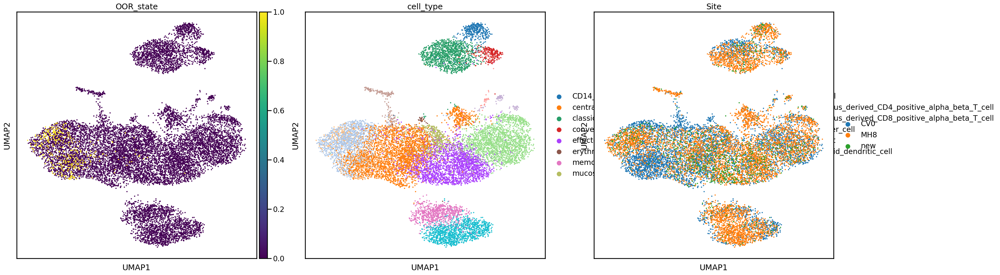

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


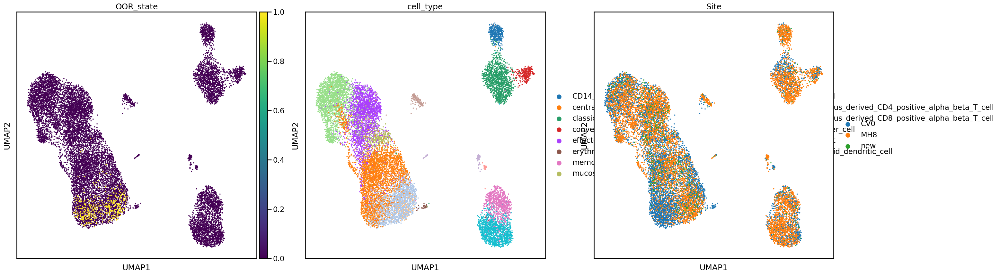

In [147]:
plt.rcParams['figure.figsize'] = [10,10]
sc.pl.umap(acr_adata, color=['OOR_state', 'cell_type', 'Site'], size=30)
sc.pl.umap(cr_adata, color=['OOR_state', 'cell_type', 'Site'], size=30)

In [150]:
milopy.utils.build_nhood_graph(acr_adata)
milopy.utils.build_nhood_graph(cr_adata)

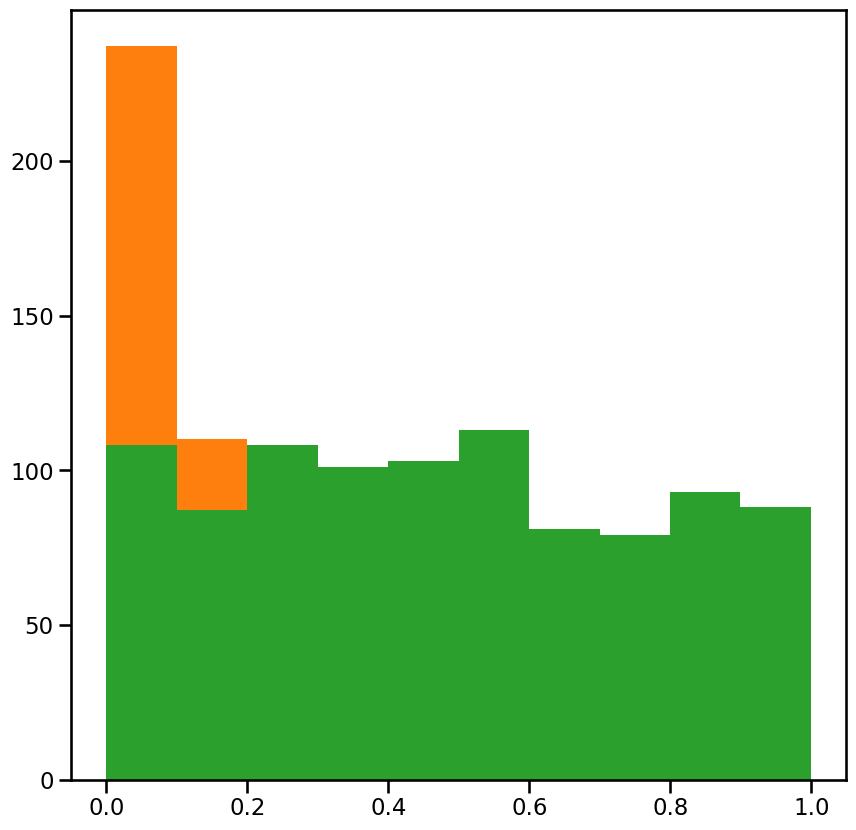

In [151]:
plt.hist(acr_adata.uns['nhood_adata'].obs['PValue']);
plt.hist(cr_adata.uns['nhood_adata'].obs['PValue']);
plt.hist(acr_adata.uns['nhood_adata'].obs['PValue']);

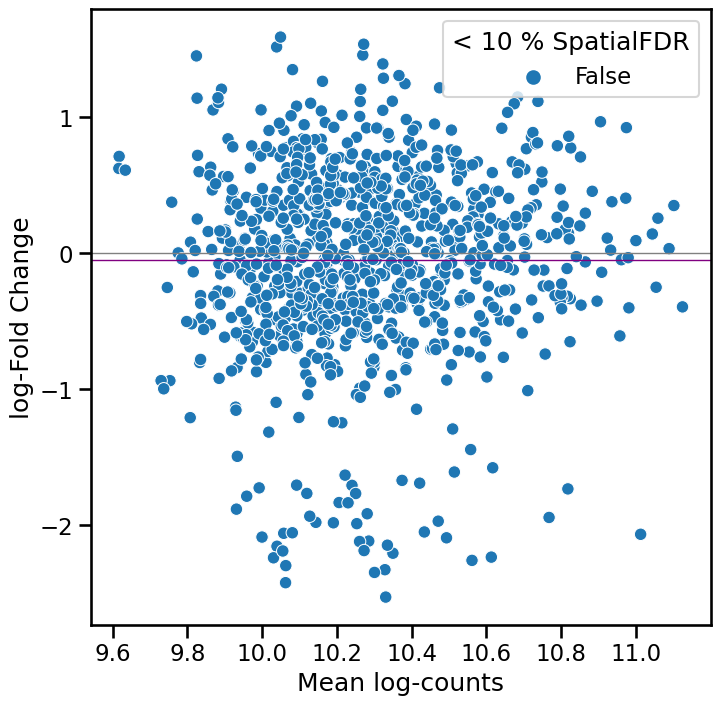

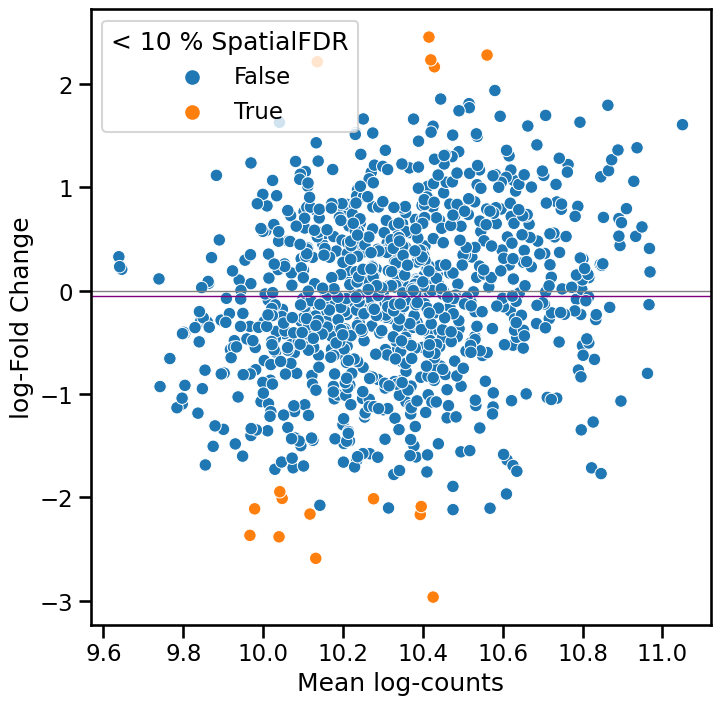

In [152]:

def plot_MA(nhood_adata, alpha=0.1):
    df = nhood_adata.obs
    emp_null = df[df["SpatialFDR"] >= alpha]["logFC"].mean()
    df["Sig"] = df["SpatialFDR"] < alpha
    sns.scatterplot(data=df, x="logCPM", y="logFC", hue="Sig")
    plt.axhline(y=0, color="grey", linewidth=1)
    plt.axhline(y=emp_null, color="purple", linewidth=1)
    plt.legend(title=f"< {int(alpha*100)} % SpatialFDR")
    plt.xlabel("Mean log-counts")
    plt.ylabel("log-Fold Change")
    plt.show()
    
plt.rcParams['figure.figsize'] = [8,8]    
plot_MA(acr_adata.uns['nhood_adata'])
plot_MA(cr_adata.uns['nhood_adata'])

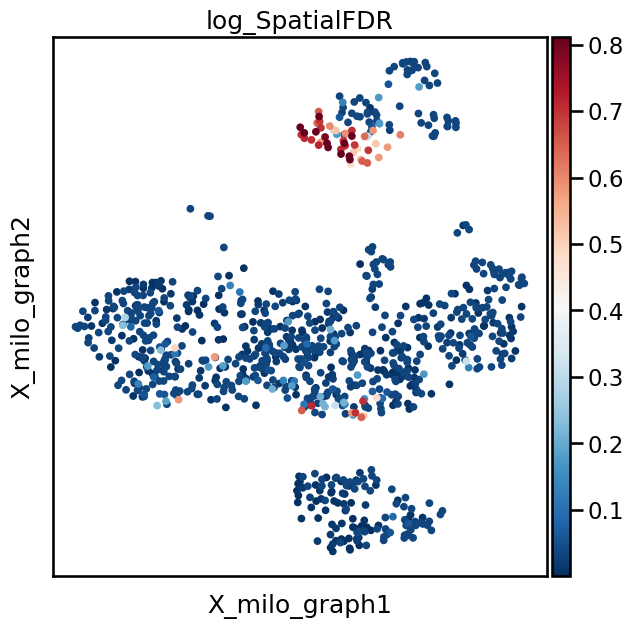

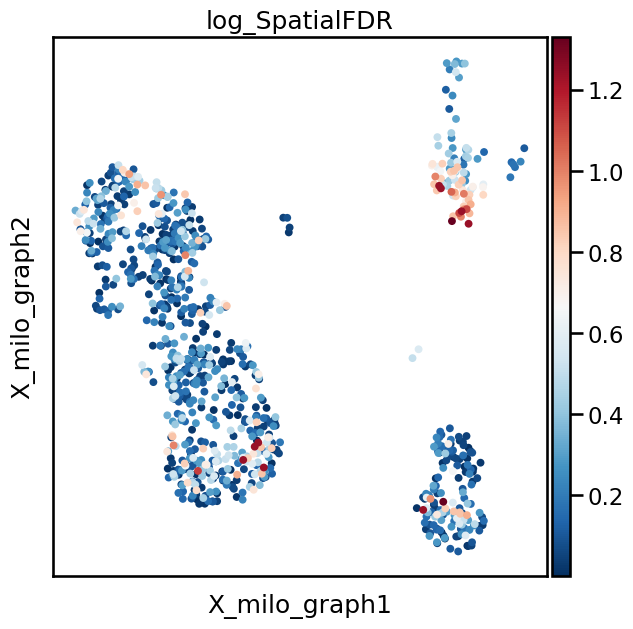

In [154]:
acr_adata.uns['nhood_adata'].obs['log_SpatialFDR'] = - np.log10(acr_adata.uns['nhood_adata'].obs['SpatialFDR'])
cr_adata.uns['nhood_adata'].obs['log_SpatialFDR'] = - np.log10(cr_adata.uns['nhood_adata'].obs['SpatialFDR'])
sc.pl.embedding(acr_adata.uns['nhood_adata'], basis='X_milo_graph', color='log_SpatialFDR', cmap='RdBu_r')
sc.pl.embedding(cr_adata.uns['nhood_adata'], basis='X_milo_graph', color='log_SpatialFDR', cmap='RdBu_r')

## Check cDC

In [62]:
d = 'qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022'

In [63]:
acr_adata = milopy.utils.read_milo_adata(outdir + d + '/acr_design.h5ad', backed=True)
cr_adata = milopy.utils.read_milo_adata(outdir + d + '/cr_design.h5ad', backed=True)

In [65]:
sc.tl.umap(acr_adata)
sc.tl.umap(cr_adata)

In [66]:
acr_adata.obs['Site'] = acr_adata.obs['donor_id'].str[0:3]
cr_adata.obs['Site'] = cr_adata.obs['donor_id'].str[0:3]

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


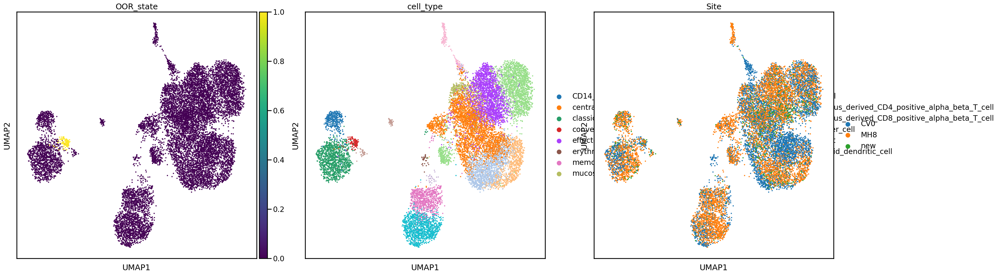

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


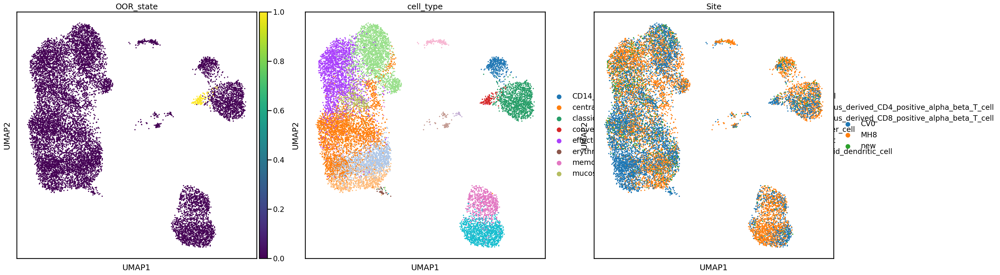

In [67]:
plt.rcParams['figure.figsize'] = [10,10]
sc.pl.umap(acr_adata, color=['OOR_state', 'cell_type', 'Site'], size=30)
sc.pl.umap(cr_adata, color=['OOR_state', 'cell_type', 'Site'], size=30)

# Alternatives to differential abundance analysis for OOR state detection

We test the ability to detect OOR states without using differential abundance analysis, testing 3 alternatives:

1. Distance/segregation of OOR cells in latent space
2. Query-mapping quality control metrics
3. Differential expression analysis after label transfer

## 1. Distance/segregation of OOR cells in latent space

Here we want to test whether position in the latent space can always distinguish the OOR state. We train a KNN classifier to distinguish the OOR state in simulations with one removed OOR state.

In [12]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

def classify_OOR(adata, n_iters = 5, split_seed=42):
    '''Train classifier on latent space to identify OOR cell state in disease cells'''
    X = adata[adata.obs['dataset_group'] == 'query'].obsm['X_scVI'].copy()
    y = adata[adata.obs['dataset_group'] == 'query'].obs['OOR_state']
    class_out = {'precision':[], 'recall':[], 'f1-score':[], 'accuracy':[], 'support':[]}
    for s in np.arange(split_seed, split_seed+n_iters):
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.33, random_state=s)

#         clf = LogisticRegression(random_state=0).fit(X_train, y_train)
        clf = KNeighborsClassifier(n_neighbors=50, metric="euclidean").fit(X_train, y_train)
        class_out_iter = classification_report(y_test, clf.predict(X_test), output_dict=True)['1']
        class_out_iter['accuracy'] = classification_report(y_test, clf.predict(X_test), output_dict=True)['accuracy']
        for k in class_out.keys():
            class_out[k].append(class_out_iter[k])
    return(pd.DataFrame(class_out))

In [19]:
classifier_outs_all = pd.DataFrame()
for ct in [k for k,v in oor_state_size.items() if v > 100]: ## Select simulations with at least 100 cells in OOR state 
    d = f'qPBMC_500cells_demo_perturb_cell_type{ct}_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022'
    print(d)
    acr_adata = milopy.utils.read_milo_adata(outdir + d + '/ACR_design.scArches_milo.h5ad', backed=True)
    ar_adata = milopy.utils.read_milo_adata(outdir + d + '/ar_design.h5ad', backed=True)
    cr_adata = milopy.utils.read_milo_adata(outdir + d + '/CR_design.scArches_milo.h5ad', backed=True)
    cr_scvi_adata = milopy.utils.read_milo_adata(outdir + d + '/CR_design.scVI_milo.h5ad', backed=True)
    AR_classifier_outs = classify_OOR(ar_adata, split_seed=312, n_iters=10)
    AR_classifier_outs['design'] = 'AR'
    CR_classifier_outs = classify_OOR(cr_adata, split_seed=312, n_iters=10)
    CR_classifier_outs['design'] = 'CR scArches'
    CR_scVI_classifier_outs = classify_OOR(cr_scvi_adata, split_seed=312, n_iters=10)
    CR_scVI_classifier_outs['design'] = 'CR scVI'
    ACR_classifier_outs = classify_OOR(acr_adata, split_seed=312, n_iters=10)
    ACR_classifier_outs['design'] = 'ACR'
    classifier_outs = pd.concat([ACR_classifier_outs, AR_classifier_outs, CR_classifier_outs, CR_scVI_classifier_outs])
    classifier_outs['OOR_state_name'] = ct
    classifier_outs_all = pd.concat([classifier_outs_all, classifier_outs])

qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
qPBMC_500cells_demo_perturb_cell_typenaive_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
qPBMC_500cells_demo_perturb_cell_typecentral_memory_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
qPBMC_500cells_demo_perturb_cell_typeplatelet_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
qPBMC_500cells_demo_perturb_cell_typenaive_thymus_derived_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
qPBMC_500cells_demo_perturb_cell_typeclassical_monocyte_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
qPBMC_500cells_demo_perturb_cell_typenaive_thymus_derived_CD8_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
qPBMC_500cells_demo_per

In [20]:
classifier_outs_all

,precision,recall,f1-score,accuracy,support,design,OOR_state_name
0,0.854962,0.829630,0.842105,0.983044,135,ACR,memory_B_cell
1,0.880597,0.825175,0.851986,0.983448,143,ACR,memory_B_cell
2,0.814570,0.848276,0.831081,0.979814,145,ACR,memory_B_cell
3,0.834532,0.794521,0.814035,0.978603,146,ACR,memory_B_cell
4,0.805970,0.857143,0.830769,0.982237,126,ACR,memory_B_cell
...,...,...,...,...,...,...,...
5,0.897436,0.972222,0.933333,0.997981,36,CR scVI,CD14_low_CD16_positive_monocyte
6,0.936170,0.936170,0.936170,0.997578,47,CR scVI,CD14_low_CD16_positive_monocyte
7,0.938776,0.978723,0.958333,0.998385,47,CR scVI,CD14_low_CD16_positive_monocyte
8,0.953488,0.976190,0.964706,0.998789,42,CR scVI,CD14_low_CD16_positive_monocyte


In [52]:
# plt.rcParams['figure.figsize'] = [6,10]
# sorted_cts = classifier_outs_all[classifier_outs_all.design == 'ACR'].groupby('OOR_state_name').first()['support'].sort_values().index

# sns.boxplot(data = classifier_outs_all, y = 'OOR_state_name', x = 'precision', hue = 'design', orient = 'h', order=sorted_cts, width=0.5);
# plt.show()
# sns.boxplot(data = classifier_outs_all, y = 'OOR_state_name', x = 'accuracy', hue = 'design', orient = 'h', order=sorted_cts, width=0.5)

In [21]:
classifier_outs_all['OOR_state_name'] = [short_pop_names[x] for x in classifier_outs_all.OOR_state_name]

In [22]:
%%R -i classifier_outs_all
head(classifier_outs_all)

  precision    recall  f1-score  accuracy support design OOR_state_name
1 0.8549618 0.8296296 0.8421053 0.9830440     135    ACR       memory B
2 0.8805970 0.8251748 0.8519856 0.9834477     143    ACR       memory B
3 0.8145695 0.8482759 0.8310811 0.9798143     145    ACR       memory B
4 0.8345324 0.7945205 0.8140351 0.9786031     146    ACR       memory B
5 0.8059701 0.8571429 0.8307692 0.9822366     126    ACR       memory B
6 0.8031496 0.8095238 0.8063241 0.9802180     126    ACR       memory B


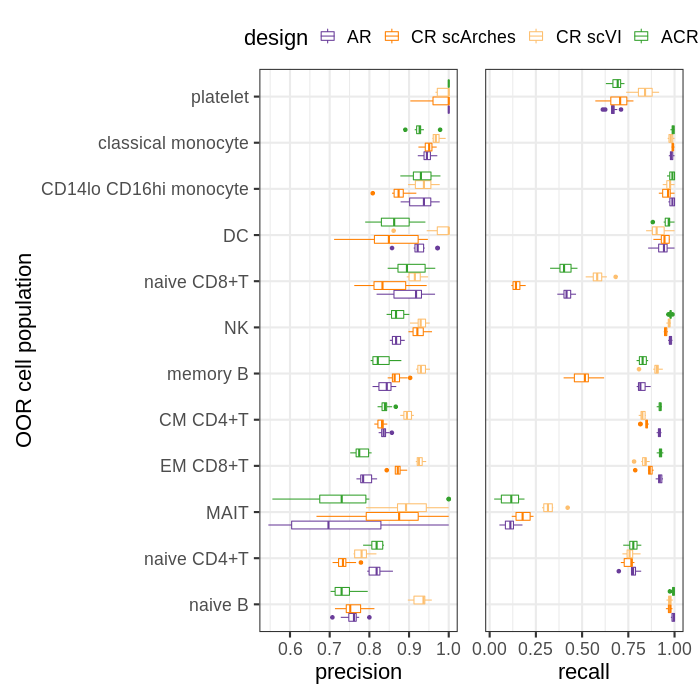

In [24]:
%%R -w 700 -h 700
pl_df <- classifier_outs_all %>%
    group_by(OOR_state_name) %>%
    mutate(mean_precision = median(precision), mean_accuracy = median(accuracy)) %>%
    ungroup() %>%
    arrange(mean_precision) %>%
    mutate(OOR_state_name = factor(OOR_state_name, levels=unique(OOR_state_name))) %>%
    mutate(design = factor(design, levels=c('AR', "CR scArches", 'CR scVI', "ACR"))) 
    
p1 <- pl_df %>%
    ggplot(aes(OOR_state_name, precision, color=design)) +
    geom_boxplot() +
    scale_color_manual(values=design_palette) +
    coord_flip() +
    theme_bw(base_size=22) +
    xlab('OOR cell population') +
    theme(legend.position='top')

p2 <- pl_df %>%
    ggplot(aes(OOR_state_name, `recall`, color=design)) +
    geom_boxplot() +
    scale_color_manual(values=design_palette) +
    coord_flip() +
    theme_bw(base_size=22) +
    theme(legend.position='top')
    
(p1 + (p2 + remove_y_axis()) + plot_layout(guides='collect') & theme(legend.position='top')) +
ggsave(paste0(figdir, 'OOR_state_classifier_precision_recall.png'), width=12, height=7) +
ggsave(paste0(figdir, 'OOR_state_classifier_precision_recall.pdf'), width=12, height=7)

## 2. Comparison to mapping QC metrics

Compute label transfer QC and reconstruction error

```bash
outdir=/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/tmp/

for s in $h5ad_files; do
    python run_mappingQC.py $s; 
    done

h5ad_files=$(ls $outdir/qPBMC_500cells_demo_perturb_cell_type*/ar_design.h5ad)
for s in $h5ad_files; do
    echo "python run_mappingQC_reconstruction.py $s" | \
        bsub -G teichlab -o logfile-mappingQC-%J.out -e logfile-mappingQC-%J.err -q gpu-normal -M50000 -R "select[mem>50000] rusage[mem=50000]" -gpu "mode=shared:j_exclusive=no:gmem=6000:num=1" 
done

```

Parse results

In [19]:
def get_mean_confidence_x_nhood(adata, obs_names, confidence_col = 'conf_gex'):
    '''
    Compute average confidence per neighbourhood using a subset of cells
    '''
    nhood_mat = adata[obs_names].obsm['nhoods']
    mean_conf_nhoods = nhood_mat.T.dot(
            scipy.sparse.csr_matrix(adata.obs.loc[obs_names, confidence_col]).T)
    mean_conf_nhoods = mean_conf_nhoods.toarray()/np.array(nhood_mat.T.sum(1))
    mean_conf_nhoods = np.nan_to_num(mean_conf_nhoods, 0) ## zero confidence where we have no cells
    return(mean_conf_nhoods)

def harmonize_output(adata, signif_alpha=0.1):
    if adata.isbacked:
        sample_adata = adata.uns['nhood_adata'].to_memory().T
    else:
        sample_adata = adata.uns["nhood_adata"].T.copy()
    sample_adata.var["OOR_score"] = sample_adata.var["logFC"].copy()
    sample_adata.var["OOR_signif"] = (
        ((sample_adata.var["SpatialFDR"] < signif_alpha) &
         (sample_adata.var["logFC"] > 0)).astype(int).copy()
    )
    sample_adata.varm["groups"] = adata.obsm["nhoods"].T
    adata.uns["sample_adata"] = sample_adata.copy()
   

In [20]:
 
mappingQC_nhoods_all = pd.DataFrame()
for d in os.listdir(outdir):
    if not d.endswith('.h5ad') and not d.endswith('.pkl') and d.startswith('qPBMC'):
        if 'neutrophil' not in d:
            print(f'Reading {d}')
            acr_adata = milopy.utils.read_milo_adata(outdir + d + '/acr_design.h5ad', backed='r')
            for m in ['labels', 'reconstruction']:
                mappingQC_res_df = pd.read_csv(outdir + d + f'/ar_design.mappingQC_{m}.csv', index_col = 0)

                ## Add mappingQC metric
                acr_adata.obs[f'mappingQC_{m}'] = np.nan
                acr_adata.obs.loc[mappingQC_res_df.index, f'mappingQC_{m}'] = mappingQC_res_df[f'mappingQC_{m}']

                ## Compute avg mappingQC metric per nhood
                acr_adata.uns['nhood_adata'].obs[f'mean_mappingQC_{m}'] = get_mean_confidence_x_nhood(
                    acr_adata, acr_adata.obs_names[acr_adata.obs_names.isin(mappingQC_res_df.index)],
                    confidence_col=f'mappingQC_{m}'
                ).ravel()
                
            harmonize_output(acr_adata)
            oor_benchmark.metrics.utils.make_OOR_per_group(acr_adata)

            nhoods_out_df = acr_adata.uns['sample_adata'].var.copy()
            nhoods_out_df['d'] = d
            mappingQC_nhoods_all = pd.concat([mappingQC_nhoods_all, nhoods_out_df])


mappingQC_nhoods_all['design'] = 'AR'
mappingQC_nhoods_all['OOR_state_name'] = [x[-1].split('_query')[0] for x in mappingQC_nhoods_all['d'].str.split("cell_type")]

Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typenaive_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typecentral_memory_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplasmablast_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplatelet_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplasmacytoid_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typenaive_thymus_derived_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2

In [21]:
mappingQC_nhoods_all

,index_cell,kth_distance,nhood_annotation,nhood_annotation_frac,logFC,logCPM,F,PValue,FDR,SpatialFDR,mean_mappingQC_labels,mean_mappingQC_reconstruction,OOR_score,OOR_signif,n_OOR_cells,frac_OOR_cells,OOR_state_group,d,design,OOR_state_name
0,10_1038_s41591_021_01329_2-CGCGTTTTCCTAGGGC-MH...,1.871045,natural_killer_cell,0.828767,-0.497593,10.073818,1.037823e+00,0.313319,0.884221,0.884921,0.074451,0.242772,-0.497593,0,0.0,0.00000,0,qPBMC_500cells_demo_perturb_cell_typememory_B_...,AR,memory_B_cell
1,10_1038_s41591_021_01329_2-TTTCCTCAGGCGTACA-MH...,2.511474,plasmacytoid_dendritic_cell,0.607843,1.259110,9.730400,6.349112e+00,0.015020,0.264078,0.270040,0.062245,0.240509,1.259110,0,60.0,0.37037,1,qPBMC_500cells_demo_perturb_cell_typememory_B_...,AR,memory_B_cell
2,10_1038_s41591_021_01329_2-CCGTACTGTTCGGGCT-MH...,1.641383,classical_monocyte,0.979592,-1.712137,10.629959,6.693454e+00,0.012712,0.248942,0.252890,0.032437,0.231754,-1.712137,0,0.0,0.00000,0,qPBMC_500cells_demo_perturb_cell_typememory_B_...,AR,memory_B_cell
3,10_1038_s41591_021_01329_2-GGGCACTAGCTAACTC-MH...,1.837092,natural_killer_cell,0.762821,-0.944727,10.373903,3.259362e+00,0.077194,0.575895,0.582552,0.146945,0.282051,-0.944727,0,0.0,0.00000,0,qPBMC_500cells_demo_perturb_cell_typememory_B_...,AR,memory_B_cell
4,10_1038_s41591_021_01329_2-AACTCCCTCTCTGCTG-MH...,1.616541,natural_killer_cell,0.950000,-1.147661,10.311019,4.860469e+00,0.032230,0.378697,0.381139,0.022522,0.268444,-1.147661,0,0.0,0.00000,0,qPBMC_500cells_demo_perturb_cell_typememory_B_...,AR,memory_B_cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,10_1038_s41591_021_01329_2-TTGGCAAGTTGGACCC-MH...,1.453310,naive_B_cell,0.991525,0.359222,10.388177,3.657575e-01,0.548085,1.000000,1.000000,0.030736,0.266802,0.359222,0,0.0,0.00000,0,qPBMC_500cells_demo_perturb_cell_typeCD14_low_...,AR,CD14_low_CD16_positive_monocyte
996,10_1038_s41591_021_01329_2-AAGGAGCCAGATGGGT-MH...,1.297452,naive_B_cell,0.909091,0.007185,10.807078,-1.375875e-08,1.000000,1.000000,1.000000,0.058777,0.266971,0.007185,0,0.0,0.00000,0,qPBMC_500cells_demo_perturb_cell_typeCD14_low_...,AR,CD14_low_CD16_positive_monocyte
997,10_1038_s41591_021_01329_2-ACTATCTCAGTATCTG-MH...,1.865222,central_memory_CD4_positive_alpha_beta_T_cell,0.440945,-0.032135,10.295449,4.014793e-03,0.949729,1.000000,1.000000,0.252329,0.239632,-0.032135,0,0.0,0.00000,0,qPBMC_500cells_demo_perturb_cell_typeCD14_low_...,AR,CD14_low_CD16_positive_monocyte
998,10_1038_s41591_021_01329_2-ACGAGCCAGCGAGAAA-MH...,1.493588,naive_B_cell,0.976923,-0.125698,10.166201,5.931539e-02,0.808587,1.000000,1.000000,0.033095,0.254019,-0.125698,0,0.0,0.00000,0,qPBMC_500cells_demo_perturb_cell_typeCD14_low_...,AR,CD14_low_CD16_positive_monocyte


### Compute AUPRC on neighbourhoods

In [22]:
from oor_benchmark.metrics import auprc
AUPRC_df_mappingQC = pd.DataFrame()
for p in mappingQC_nhoods_all['OOR_state_name'].unique():
    for m in ['mean_mappingQC_labels', 'mean_mappingQC_reconstruction', 'logFC']:
        mappingQC_res_df = mappingQC_nhoods_all[mappingQC_nhoods_all['OOR_state_name'] == p].copy()
        mappingQC_res_df['OOR_score'] = mappingQC_res_df[m].copy()
        
        df = auprc.auprc(mappingQC_res_df)
        df['OOR_state_name'] = p
        df['metric'] = m
        
        AUPRC_df_mappingQC = pd.concat([AUPRC_df_mappingQC, df])

In [23]:
AUPRC_df_mappingQC

,AUPRC,no_skill_thresh,OOR_state_name,metric
0,0.039109,0.069149,memory_B_cell,mean_mappingQC_labels
0,0.086593,0.069149,memory_B_cell,mean_mappingQC_reconstruction
0,0.773721,0.069149,memory_B_cell,logFC
0,0.005485,0.008163,conventional_dendritic_cell,mean_mappingQC_labels
0,0.004110,0.008163,conventional_dendritic_cell,mean_mappingQC_reconstruction
0,0.288989,0.008163,conventional_dendritic_cell,logFC
0,0.052769,0.101266,naive_B_cell,mean_mappingQC_labels
0,0.162779,0.101266,naive_B_cell,mean_mappingQC_reconstruction
0,0.889435,0.101266,naive_B_cell,logFC
0,0.294354,0.246294,central_memory_CD4_positive_alpha_beta_T_cell,mean_mappingQC_labels


/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


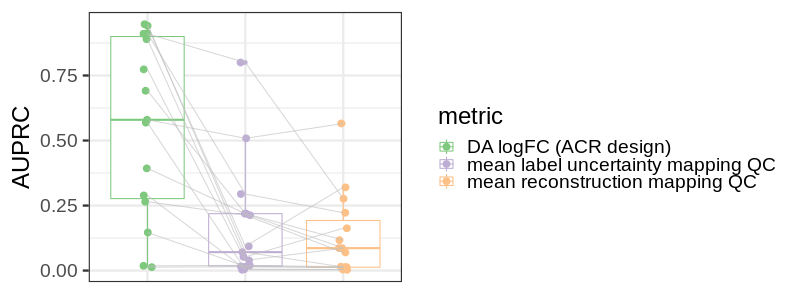

In [23]:
%%R -i AUPRC_df_mappingQC -w 800 -h 300
AUPRC_df_mappingQC %>%
    ggplot(aes(metric, AUPRC, color=metric)) +
    geom_boxplot() +
    geom_jitter(size=3, width=0.05) +
    geom_line(aes(group=OOR_state_name), color='grey', alpha=0.6) +
    scale_color_brewer(palette='Accent', 
                       labels=c(logFC='DA logFC (ACR design)', 
                           mean_mappingQC_reconstruction = 'mean reconstruction mapping QC', 
                           mean_mappingQC_labels = 'mean label uncertainty mapping QC')) +
    theme_bw(base_size=24) +
    remove_x_axis() +
    ggsave(paste0(figdir, "mappingQC_AUPRC.pdf"), width=10, height=5) +
    ggsave(paste0(figdir, "mappingQC_AUPRC.png"), width=10, height=5) 
    

### Compute AUPRC on cells

#### Reconstruction

In [24]:
mappingQC_res_df_all = pd.DataFrame()
for d in os.listdir(outdir):
    if not d.endswith('.h5ad') and not d.endswith('.pkl') and d.startswith('qPBMC'):
        if 'neutrophil' not in d:
            print(f'Reading {d}')
            mappingQC_res_df = pd.read_csv(outdir + d + '/ar_design.mappingQC_reconstruction.csv', index_col = 0)
            mappingQC_res_df['d'] = d
            mappingQC_res_df_all = pd.concat([mappingQC_res_df_all, mappingQC_res_df])


mappingQC_res_df_all['design'] = 'AR'
mappingQC_res_df_all['OOR_state_name'] = [x[-1].split('_query')[0] for x in mappingQC_res_df_all['d'].str.split("cell_type")]
mappingQC_res_df_all['OOR_score'] = mappingQC_res_df_all['mappingQC_reconstruction'].copy()
mappingQC_res_df_all['OOR_state_group'] = mappingQC_res_df_all['OOR_state'].copy()
mappingQC_res_df_all['OOR_state_name_pl'] = [short_pop_names[x] for x in mappingQC_res_df_all['OOR_state_name']]

Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typenaive_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typecentral_memory_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplasmablast_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplatelet_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplasmacytoid_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typenaive_thymus_derived_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2

In [25]:
AUPRC_df_mappingQC = pd.DataFrame()
for p in mappingQC_res_df_all['OOR_state_name_pl'].unique():
    df = auprc.auprc(mappingQC_res_df_all[mappingQC_res_df_all['OOR_state_name_pl'] == p])
    df['OOR_state_name_pl'] = p
    AUPRC_df_mappingQC = pd.concat([AUPRC_df_mappingQC, df])

In [26]:
%%R -i mappingQC_res_df_all
head(mappingQC_res_df_all)

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


  mappingQC_reconstruction OOR_state
1                0.2753007         0
2                0.2703676         0
3                0.3488741         0
4                0.1957048         0
5                0.1957743         0
6                0.3073377         0
                                                                                                           d
1 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
2 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
3 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
4 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
5 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
6 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591

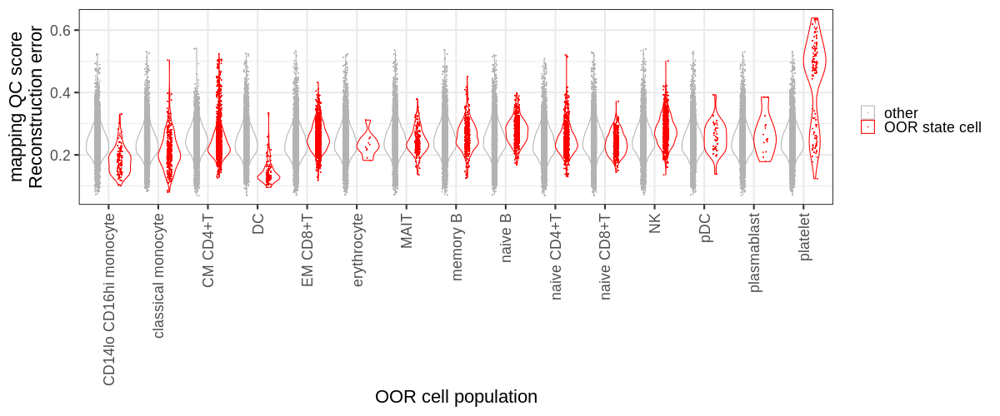

In [27]:
%%R -w 1200 -h 500 -i figdir
recon_pl <- mappingQC_res_df_all %>%
    mutate(OOR_state = factor(ifelse(OOR_state == 1, "OOR state cell", "other"), levels=c('other', 'OOR state cell'))) %>%
    ggplot(aes(OOR_state_name_pl, OOR_score, color=OOR_state)) +
    geom_violin(scale='width') +
    rasterize(geom_point(position=position_jitterdodge(jitter.width=0.2, dodge.width = 0.9), size=0.1), dpi=400) +
    theme_bw(base_size=22) +
    xlab('OOR cell population') + ylab("mapping QC score\nReconstruction error") +
    scale_color_manual(values=c(`OOR state cell` = 'red', other = 'grey70'), name='') +
    theme(axis.text.x=element_text(angle=90, vjust=0.5, hjust=1)) +
    ggsave(paste0(figdir, "mappingQC_violin_reconstruction.pdf"), width=15, height=8) +
    ggsave(paste0(figdir, "mappingQC_violin_reconstruction.png"), width=15, height=8) 
recon_pl

#### Label transfer score

In [28]:
mappingQC_res_df_all = pd.DataFrame()
for d in os.listdir(outdir):
    if not d.endswith('.h5ad') and not d.endswith('.pkl') and d.startswith('qPBMC'):
        if 'neutrophil' not in d:
            print(f'Reading {d}')
            mappingQC_res_df = pd.read_csv(outdir + d + '/ar_design.mappingQC_labels.csv', index_col = 0)
            mappingQC_res_df['d'] = d
            mappingQC_res_df_all = pd.concat([mappingQC_res_df_all, mappingQC_res_df])


mappingQC_res_df_all['design'] = 'AR'
mappingQC_res_df_all['OOR_state_name'] = [x[-1].split('_query')[0] for x in mappingQC_res_df_all['d'].str.split("cell_type")]
mappingQC_res_df_all['OOR_score'] = mappingQC_res_df_all['mappingQC_labels'].copy()
mappingQC_res_df_all['OOR_state_group'] = mappingQC_res_df_all['OOR_state'].copy()
mappingQC_res_df_all['OOR_state_name_pl'] = [short_pop_names[x] for x in mappingQC_res_df_all['OOR_state_name']]

Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeconventional_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typenaive_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typecentral_memory_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplasmablast_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplatelet_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeplasmacytoid_dendritic_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typenaive_thymus_derived_CD4_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2

In [29]:
AUPRC_df_mappingQC = pd.DataFrame()
for p in mappingQC_res_df_all['OOR_state_name_pl'].unique():
    df = auprc.auprc(mappingQC_res_df_all[mappingQC_res_df_all['OOR_state_name_pl'] == p])
    df['OOR_state_name_pl'] = p
    AUPRC_df_mappingQC = pd.concat([AUPRC_df_mappingQC, df])

In [30]:
%%R -i mappingQC_res_df_all
head(mappingQC_res_df_all)

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


  mappingQC_labels OOR_state
1     5.960464e-08         0
2     3.699886e-01         0
3     9.998143e-03         0
4     0.000000e+00         0
5     0.000000e+00         0
6     3.998888e-02         0
                                                                                                           d
1 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
2 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
3 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
4 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
5 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
6 qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
  design OOR_state_name    OOR_sco

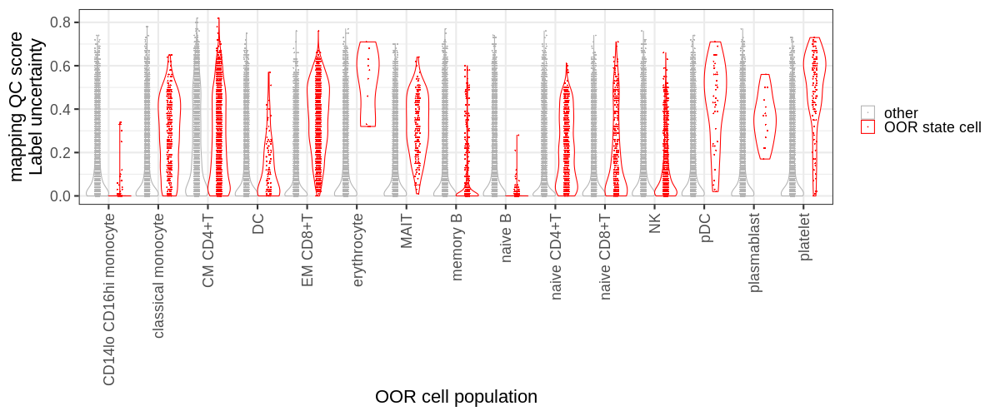

In [31]:
%%R -w 1200 -h 500 -i figdir
label_pl <- mappingQC_res_df_all %>%
    mutate(OOR_state = factor(ifelse(OOR_state == 1, "OOR state cell", "other"), levels=c('other', 'OOR state cell'))) %>%
    ggplot(aes(OOR_state_name_pl, OOR_score, color=OOR_state)) +
    geom_violin(scale='width') +
    rasterize(geom_point(position=position_jitterdodge(jitter.width=0.2, dodge.width = 0.9), size=0.1), dpi=400) +
    theme_bw(base_size=22) +
    xlab('OOR cell population') + ylab("mapping QC score\nLabel uncertainty") +
    scale_color_manual(values=c(`OOR state cell` = 'red', other = 'grey70'), name='') +
    theme(axis.text.x=element_text(angle=90, vjust=0.5, hjust=1)) +
    ggsave(paste0(figdir, "mappingQC_violin_labels.pdf"), width=15, height=5) +
    ggsave(paste0(figdir, "mappingQC_violin_labels.png"), width=15, height=5) 
label_pl

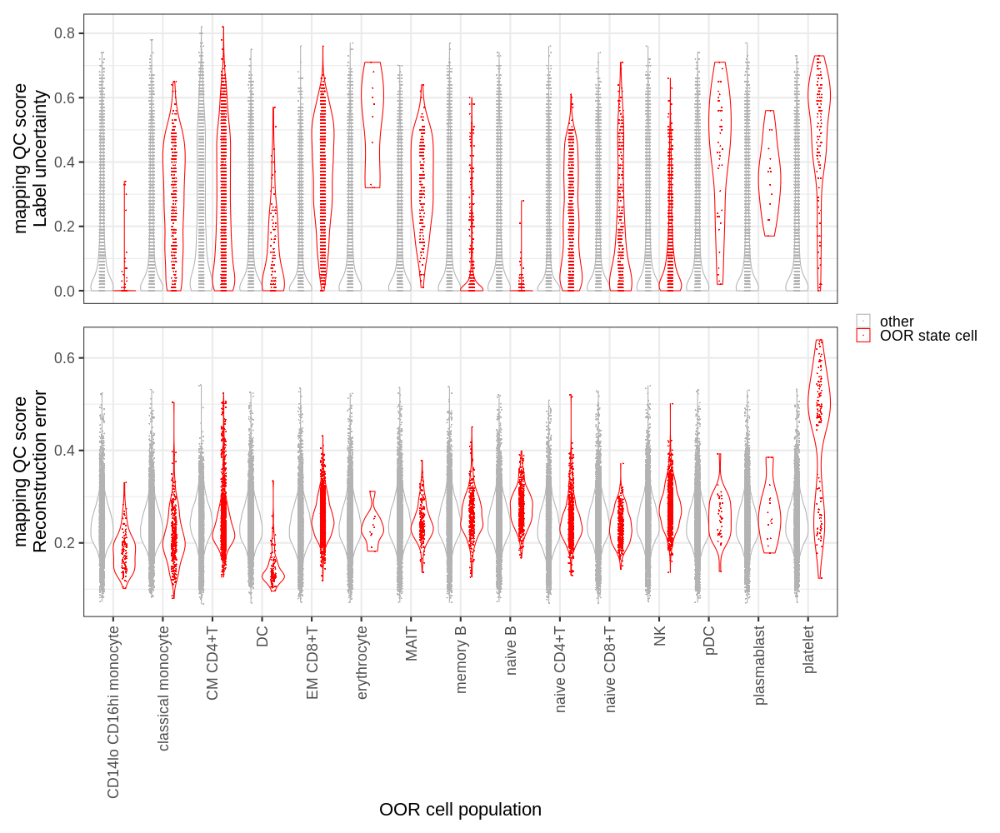

In [32]:
%%R -w 1200 -h 1000
((label_pl + remove_x_axis()) /recon_pl ) +
    plot_layout(guides='collect') +
    ggsave(paste0(figdir, "mappingQC_violin.pdf"), width=15, height=10) +
    ggsave(paste0(figdir, "mappingQC_violin.png"), width=15, height=10)

### Compare mapping QC between control and query

In [26]:
import oor_benchmark.metrics

In [20]:
from oor_benchmark.methods.scArches_mappingQC import _weighted_knn_transfer_uncertainty
import oor_benchmark.metrics

In [27]:
embedding_reference = 'atlas'
m = 'labels'
# mappingQC_delta_all = pd.DataFrame()
mappingQC_delta_all = pd.read_csv(outdir + 'mappingQC_labels_delta_all.csv')

In [28]:
for d in os.listdir(outdir):
    if not d.endswith('.h5ad') and not d.endswith('.pkl') and d.startswith('qPBMC'):
        if 'neutrophil' not in d:
            if d not in mappingQC_delta_all['d'].unique().tolist():
                print(f"Reading {d}")
                acr_adata = milopy.utils.read_milo_adata(outdir + d + '/acr_design.h5ad', backed='r')
                ar_adata = sc.read_h5ad(outdir + d + '/ar_design.h5ad', backed='r') ## Load labels
                train_labels = ar_adata.obs[ar_adata.obs['dataset_group'] == embedding_reference]['cell_annotation']

                # Compute label transfer probability
                mappingQC_labels = _weighted_knn_transfer_uncertainty(
                    outdir + d + f"/weighted_KNN_classifier.{embedding_reference}.pkl",
                    query_adata=acr_adata[acr_adata.obs["dataset_group"] != embedding_reference],
                    train_labels = train_labels,
                    )["pred_uncertainty"]

                acr_adata.obs['mappingQC_labels'] = mappingQC_labels.astype('float')


                ## Compute avg mappingQC metric per nhood per dataset group
                acr_adata.uns['nhood_adata'].obs[f'mean_mappingQC_{m}_query'] = get_mean_confidence_x_nhood(
                    acr_adata, acr_adata.obs_names[acr_adata.obs['dataset_group'] == 'query'],
                    confidence_col=f'mappingQC_{m}'
                ).ravel()

                acr_adata.uns['nhood_adata'].obs[f'mean_mappingQC_{m}_ctrl'] = get_mean_confidence_x_nhood(
                    acr_adata, acr_adata.obs_names[acr_adata.obs['dataset_group'] == 'ctrl'],
                    confidence_col=f'mappingQC_{m}'
                ).ravel()

                ## Compute delta btw mappingQC in query and ctrl
                acr_adata.uns['nhood_adata'].obs[f'mappingQC_delta'] = acr_adata.uns['nhood_adata'].obs[f'mean_mappingQC_{m}_query'] - acr_adata.uns['nhood_adata'].obs[f'mean_mappingQC_{m}_ctrl']

                ## Get output
                harmonize_output(acr_adata)
                oor_benchmark.metrics.utils.make_OOR_per_group(acr_adata)
                nhoods_out_df = acr_adata.uns['sample_adata'].var.copy()
                nhoods_out_df['d'] = d
                mappingQC_delta_all = pd.concat([mappingQC_delta_all, nhoods_out_df])

Reading qPBMC_500cells_demo_perturb_cell_typenatural_killer_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeeffector_memory_CD8_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typemucosal_invariant_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_perturb_cell_typeCD14_low_CD16_positive_monocyte_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022


In [34]:
mappingQC_delta_all['design'] = 'AR'
mappingQC_delta_all['OOR_state_name'] = [x[-1].split('_query')[0] for x in mappingQC_delta_all['d'].str.split("cell_type")]

In [35]:
mappingQC_delta_all.to_csv(outdir + 'mappingQC_labels_delta_all.csv')

In [44]:
AUPRC_df_mappingQC_delta = pd.DataFrame()
for p in mappingQC_delta_all['OOR_state_name'].unique():
    for m in ['mappingQC_delta', 'logFC']:
        mappingQC_res_df = mappingQC_delta_all[mappingQC_delta_all['OOR_state_name'] == p].copy()
        mappingQC_res_df['OOR_score'] = mappingQC_res_df[m].copy()
        
        df = auprc.auprc(mappingQC_res_df)
        df['OOR_state_name'] = p
        df['metric'] = m
        
        AUPRC_df_mappingQC_delta = pd.concat([AUPRC_df_mappingQC_delta, df])

In [51]:
AUPRC_df_mappingQC_delta = pd.concat([AUPRC_df_mappingQC_delta, AUPRC_df_mappingQC[AUPRC_df_mappingQC['metric'] == 'mean_mappingQC_labels']])


/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


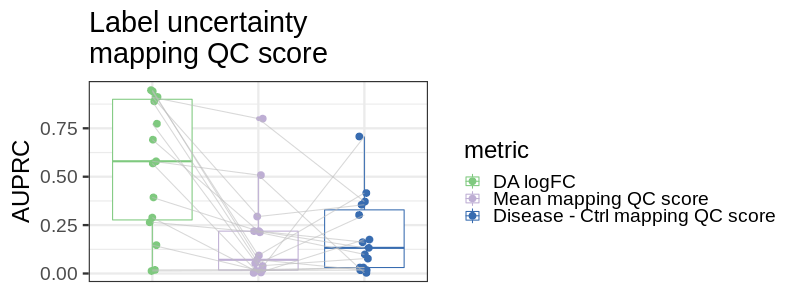

In [61]:
%%R -i AUPRC_df_mappingQC_delta -w 800 -h 300
my_colors <- RColorBrewer::brewer.pal(7, "Accent")[c(1,2,5)]

AUPRC_df_mappingQC_delta %>%
    mutate(metric = factor(metric, levels=c('logFC', 'mean_mappingQC_reconstruction','mean_mappingQC_labels', 'mappingQC_delta'))) %>%
    ggplot(aes(metric, AUPRC, color=metric)) +
    geom_boxplot() +
    geom_jitter(size=3, width=0.05) +
    geom_line(aes(group=OOR_state_name), color='grey', alpha=0.6) +
    scale_color_manual(values=my_colors,
                       labels=c(logFC='DA logFC', 
                           mappingQC_delta = 'Disease - Ctrl mapping QC score', 
                           mean_mappingQC_labels = 'Mean mapping QC score')) +
    theme_bw(base_size=24) +
    remove_x_axis() +
    ggtitle('Label uncertainty\nmapping QC score') +
    ggsave(paste0(figdir, "mappingQC_AUPRC_delta.pdf"), width=10, height=5) +
    ggsave(paste0(figdir, "mappingQC_AUPRC_delta.png"), width=10, height=5) 
    

# Assess integration quality (batch correction / bio-conservation)

```bash
conda activate oor-benchmark
cd /nfs/team205/ed6/bin/diff2atlas/src/2_simulation_design

outdir=/lustre/scratch126/cellgen/team205/ed6/PBMC_CZI_integration_filtered/tmp/
dirs=$(dirname $outdir/*/acr_design.h5ad)

for d in $dirs; do
    echo "python run_integration_quality.py ${d}/" | \
        bsub -G teichlab -o logfile-intqc-%J.out -e logfile-intqc-%J.err -M50000 -R "select[mem>50000] rusage[mem=50000]" 
done

## Just on disease
for d in $dirs; do
    echo "python run_integration_quality.py ${d}/ --filter_dataset query" | \
        bsub -G teichlab -o logfile-intqc-disease-%J.out -e logfile-intqc-disease-%J.err -M50000 -R "select[mem>50000] rusage[mem=50000]" 
done


```

In [76]:
intQC_all_df = pd.DataFrame()
for d in os.listdir(outdir):
    if not d.endswith('.h5ad') and d.startswith('qPBMC'):
        print(f'Reading {d}')
        try:
            intQC_df = pd.read_csv(outdir + d + '/integration_quality_filterquery.csv', index_col = 0)
            intQC_all_df = pd.concat([intQC_all_df, intQC_df])
        except:
            print('skipping')

Reading qPBMC_500cells_demo_shift_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
skipping
Reading qPBMC_500cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
Reading qPBMC_500cells_demo_shift_cell_typeeffector_memory_CD8_positive_alpha_beta_T_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
skipping
Reading qPBMC_500cells_demo_perturb_cell_typeCD14_low_CD16_positive_monocyte_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022weighted_KNN_classifier.ctrl.pkl
skipping
Reading qPBMC_1000cells_demo_perturb_cell_typememory_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
skipping
Reading qPBMC_1000cells_demo_perturb_cell_typehematopoietic_precursor_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
skipping
Reading qPBMC_1000cells_demo_perturb_cell_typeplatelet_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022
skipping
Reading qPBMC_500cells_demo_mixed_cell_typeclassi

In [78]:
%%R -i intQC_all_df
head(intQC_all_df)

       design resolution NMI_celltype NMI_batch OOR_state_name
1 CR scArches       0.50    0.7336963 0.1169436  memory_B_cell
2 CR scArches       0.75    0.7028606 0.1313910  memory_B_cell
3 CR scArches       1.00    0.7056059 0.1304805  memory_B_cell
4 CR scArches       1.25    0.6900864 0.1324981  memory_B_cell
5 CR scArches       1.50    0.6831376 0.1315320  memory_B_cell
6 CR scArches       1.75    0.6527978 0.1332969  memory_B_cell


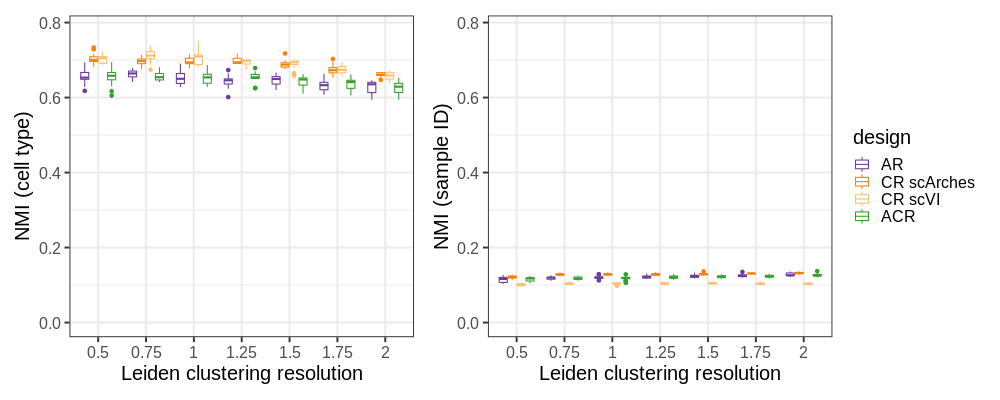

In [90]:
%%R -w 1000 -h 400
batch_pl <- intQC_all_df %>%
    mutate(design = factor(design, levels=c('AR', "CR scArches", 'CR scVI', 'ACR'))) %>%
    ggplot(aes(as.factor(resolution), NMI_batch, color=design)) +
    geom_boxplot() +
    # geom_line(aes(group=paste(OOR_state_name, design))) +
    ylim(0,0.78) +
    ylab('NMI (sample ID)') + 
    xlab("Leiden clustering resolution") +
    theme_bw(base_size=20) +
    scale_color_manual(values=design_palette) 
ct_pl <- intQC_all_df %>%
    mutate(design = factor(design, levels=c('AR', "CR scArches", 'CR scVI', 'ACR'))) %>%
    ggplot(aes(as.factor(resolution), NMI_celltype, color=design)) +
    geom_boxplot() +
    # geom_line(aes(group=paste(OOR_state_name, design))) +
    ylim(0,0.78) +
    ylab('NMI (cell type)') +
    xlab("Leiden clustering resolution") +
    theme_bw(base_size=20) +
    scale_color_manual(values=design_palette) 
    
ct_pl + batch_pl +
    plot_layout(guides='collect') +
    ggsave(paste0(figdir, "NMI_integration_plot.pdf"), width=10, height=4) +
    ggsave(paste0(figdir, "NMI_integration_plot.png"), width=10, height=4) +
    ggsave(paste0("~/mount/gdrive/diff2atlas/figure_panels/Supplementary_v2/Suppl_Figure_integrationQC.pdf"), width=12, height=4) +
    ggsave(paste0("~/mount/gdrive/diff2atlas/figure_panels/Supplementary_v2/Suppl_Figure_integrationQC.png"), width=12, height=4) 

In [71]:
import sklearn
sklearn.__version__

'1.1.2'

---

# old

In [9]:

# def _gauss_kernel(dist_nns):
#     # compute standard deviation
#     std_d = np.sqrt(sum(np.sqrt(dist_nns))/dist_nns.shape[0])
#     # apply gaussian kernel
#     adj_dist_nns = np.exp(-dist_nns/np.square(2/std_d))
#     return(adj_dist_nns)

# def _add_perturb_pop_info(pac_design_adata, min_perturb_cells = 10):
#     pac_design_adata.obs['is_perturb_pop'] = pac_design_adata.obs[population_obs] == perturb_pop
#     perturb_nhoods = pac_design_adata.obsm['nhoods'][pac_design_adata.obs['is_perturb_pop']].toarray().sum(0) > min_perturb_cells
#     pac_design_adata.uns['nhood_adata'].obs['is_perturb_nhood'] = perturb_nhoods
#     pac_design_adata.uns['nhood_adata'].obs['n_perturb_cells'] = pac_design_adata.obsm['nhoods'][pac_design_adata.obs['is_perturb_pop']].toarray().sum(0)
#     pac_design_adata.uns['nhood_adata'].obs['n_cells'] = np.array(pac_design_adata.obsm['nhoods'].sum(0)).flatten()
#     pac_design_adata.uns['nhood_adata'].obs['frac_perturb_cells'] = pac_design_adata.uns['nhood_adata'].obs['n_perturb_cells']/pac_design_adata.uns['nhood_adata'].obs['n_cells']

def get_mean_confidence_x_nhood(adata, obs_names, confidence_col = 'conf_gex'):
    '''
    Compute average confidence per neighbourhood using a subset of cells
    '''
    nhood_mat = adata[obs_names].obsm['nhoods']
    mean_conf_nhoods = nhood_mat.T.dot(
            scipy.sparse.csr_matrix(adata.obs.loc[obs_names, confidence_col]).T)
    mean_conf_nhoods = mean_conf_nhoods.toarray()/np.array(nhood_mat.T.sum(1))
    mean_conf_nhoods = np.nan_to_num(mean_conf_nhoods, 0) ## zero confidence where we have no cells
    return(mean_conf_nhoods)

def add_nhood_uncertainties(pac_design_adata, ref_group):
    pac_design_adata.obs['uncertainty_z'] = 1 - _gauss_kernel(pac_design_adata.obs['uncertainty_z'])
    pac_design_adata.obs['conf_labels'] = 1 - pac_design_adata.obs['uncertainty_labels']
    pac_design_adata.obs['conf_gex'] = 1 - pac_design_adata.obs['uncertainty_gex']
    pac_design_adata.obs['conf_z'] = 1 - pac_design_adata.obs['uncertainty_z']

    for c in ['conf_gex', 'conf_labels', 'conf_z']:
        get_nhood_adata(pac_design_adata).obs[c] = get_mean_confidence_x_nhood(
            pac_design_adata, 
            obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] != ref_group], confidence_col=c)


In [13]:
# nhood_obs_all.to_csv(outdir + 'design_comparison.nhood_obs_all.csv')

In [16]:
nhood_obs_all.to_csv(outdir + 'design_comparison.nhood_obs_all.target_n_nhood.csv')

In [93]:
nhood_obs_all = pd.read_csv(outdir + 'design_comparison.nhood_obs_all.target_n_nhood.csv', index_col=0)

In [25]:

# rename_design = {'PAC':'ACR', 'PC':"CR", "PA":"AR"}
# if any(nhood_obs_all['design'] == 'PAC'):
#     nhood_obs_all['design'] = [rename_design[x] for x in nhood_obs_all['design']]


In [28]:

short_pop_names = {
    "DC":'conventional_dendritic_cell', 
    "naive B":'naive_B_cell',
    "CM CD4+T":'central_memory_CD4_positive_alpha_beta_T_cell', 
    'plasmablast':'plasmablast',
    'platelet':'platelet', 
 "pDC":'plasmacytoid_dendritic_cell',
 'naive CD4+T':'naive_thymus_derived_CD4_positive_alpha_beta_T_cell',
"classical monocyte":'classical_monocyte', 
 'erythrocyte':'erythrocyte',
       "naive CD8+T":'naive_thymus_derived_CD8_positive_alpha_beta_T_cell',
       "NK":'natural_killer_cell',
       "EM CD8+T":'effector_memory_CD8_positive_alpha_beta_T_cell',
       'MAIT':'mucosal_invariant_T_cell', 
 'CD14lo CD16hi monocyte':'CD14_low_CD16_positive_monocyte'}

short_pop_names={v:k for k,v in short_pop_names.items()}

nhood_obs_all['perturb_pop_pl'] = [short_pop_names[x] for x in nhood_obs_all['perturb_pop']]

In [29]:
## Define perturbed neighbourhoods by maximum fraction of cells from the query-specific cluster
# (use as threshold 20% of max fraction)
for d in ['ACR', "AR", "CR"]:
    for p in nhood_obs_all.perturb_pop.unique():
        frac_group = nhood_obs_all[(nhood_obs_all.design == d) & (nhood_obs_all.perturb_pop == p)]['frac_perturb_cells']
        max_frac = frac_group.max()
        thresh = 20*(max_frac/100)
        nhood_obs_all.loc[(nhood_obs_all.design == d) & (nhood_obs_all.perturb_pop == p), 'is_perturb_nhood'] = frac_group > thresh

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


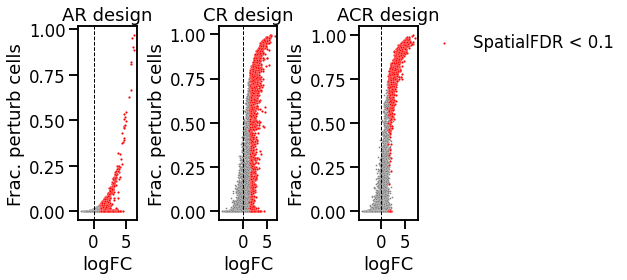

In [31]:
nhood_obs_all['signif_DA'] = (nhood_obs_all.SpatialFDR <= 0.1) & (nhood_obs_all.logFC > 0)
with rc_context({'figure.figsize':[15,5]}):
    for i,d in enumerate(["AR", "CR", 'ACR']):
        plt.subplot(1,3,i+1)
        sns.scatterplot(data=nhood_obs_all[nhood_obs_all.design==d], x='logFC',  y='frac_perturb_cells',  s=3, color='grey');
        sns.scatterplot(data=nhood_obs_all[(nhood_obs_all.design==d) & (nhood_obs_all.signif_DA)], x='logFC',  y='frac_perturb_cells',  s=5, color='red', label='SpatialFDR < 0.1');
        if i==2:
            plt.legend(bbox_to_anchor=(1.05, 1), 
                    loc='upper left', 
                    borderaxespad=0,
                    frameon=False)
        else:
            plt.legend([],[], frameon=False)
        plt.axvline(x=0, color='black', linewidth=1, linestyle='--'); 
        plt.title(f'{d} design');
        plt.ylabel("Frac. perturb cells");
        plt.tight_layout();
    plt.savefig(figdir + 'fracVSlogFC_all.pdf')

In [107]:
# with rc_context({'figure.figsize':[15,5]}):
#     for i,d in enumerate(['PAC', "PA", "PC"]):
#         plt.subplot(1,3,i+1)
#         sns.scatterplot(data=nhood_obs_all[nhood_obs_all.design==d], x='unc_gex',  y='frac_perturb_cells',  s=3, color='grey');
#         sns.scatterplot(data=nhood_obs_all[(nhood_obs_all.design==d) & (nhood_obs_all.is_perturb_nhood)], x='unc_gex',  y='n_perturb_cells',  s=5, color='red', label='TP');
#         plt.title(f'{d} design');
#         plt.ylabel("Frac. perturb cells");
#         plt.tight_layout()

# with rc_context({'figure.figsize':[15,5]}):
#     for i,d in enumerate(['PAC', "PA", "PC"]):
#         plt.subplot(1,3,i+1)
#         sns.scatterplot(data=nhood_obs_all[nhood_obs_all.design==d], x='unc_labels',  y='frac_perturb_cells',  s=3, color='grey');
#         sns.scatterplot(data=nhood_obs_all[(nhood_obs_all.design==d) & (nhood_obs_all.is_perturb_nhood)], x='unc_labels',  y='n_perturb_cells',  s=5, color='red', label='TP');
#         plt.title(f'{d} design');
#         plt.ylabel("Frac. perturb cells");
#         plt.tight_layout()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


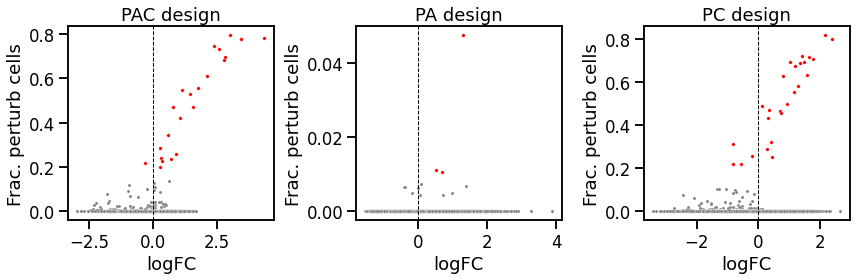

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


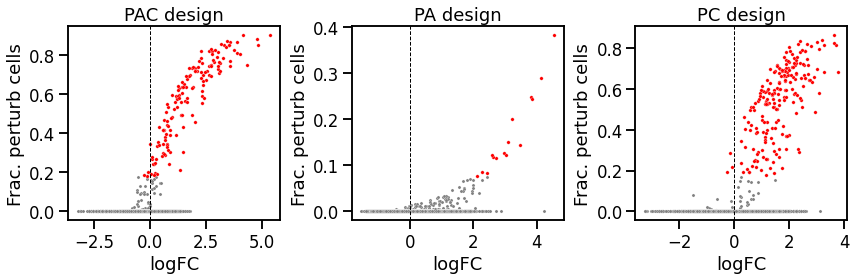

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


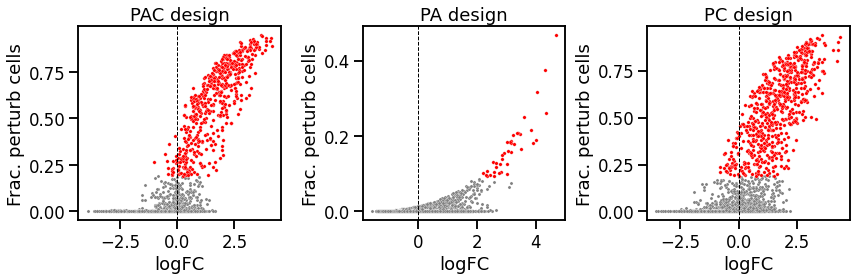

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


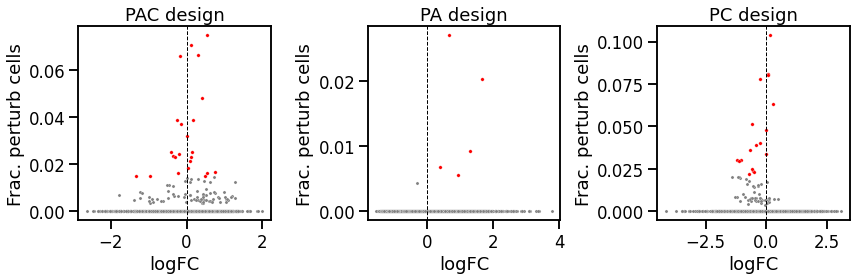

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


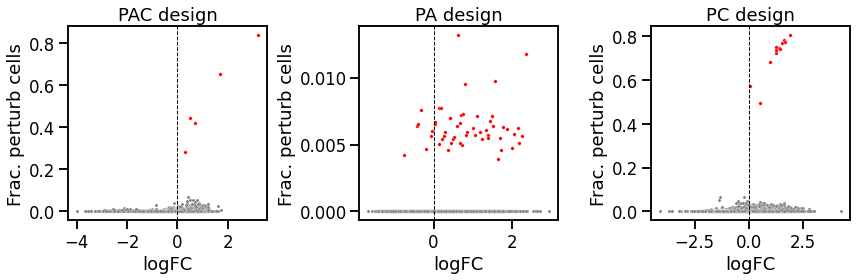

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


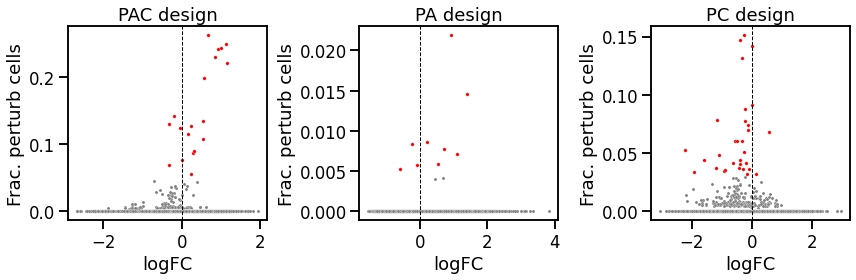

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


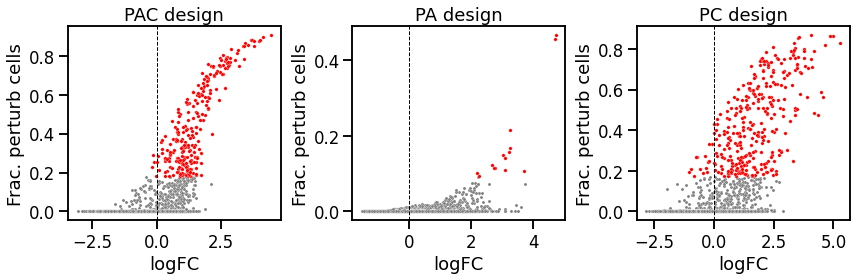

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


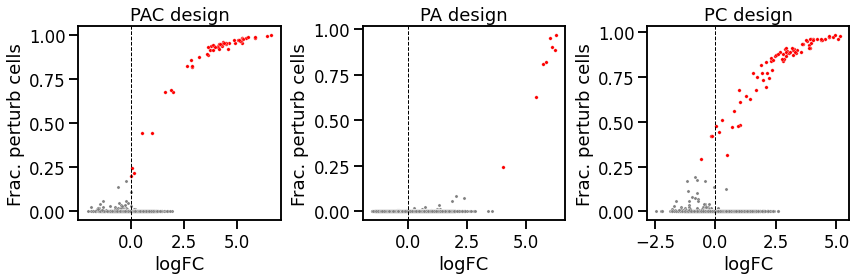

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


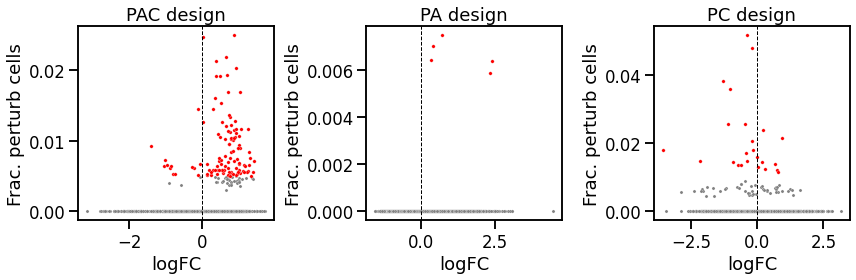

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


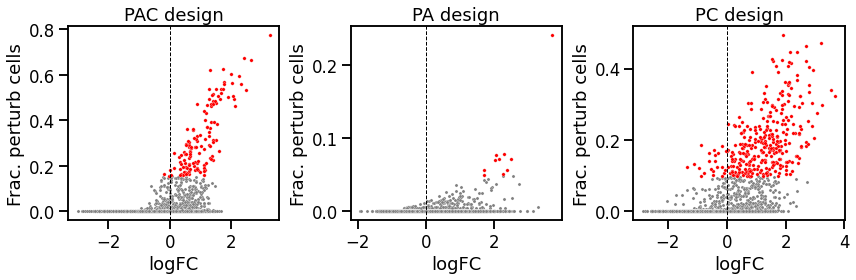

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


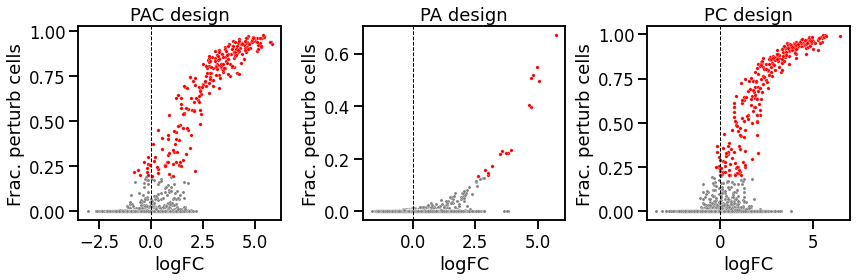

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


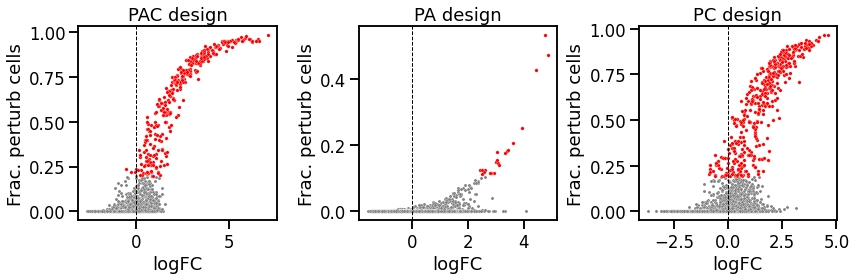

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


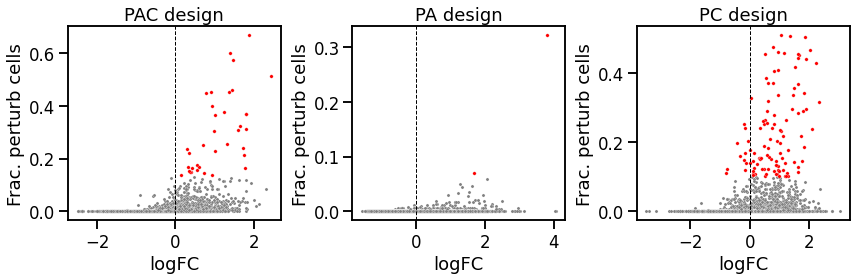

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


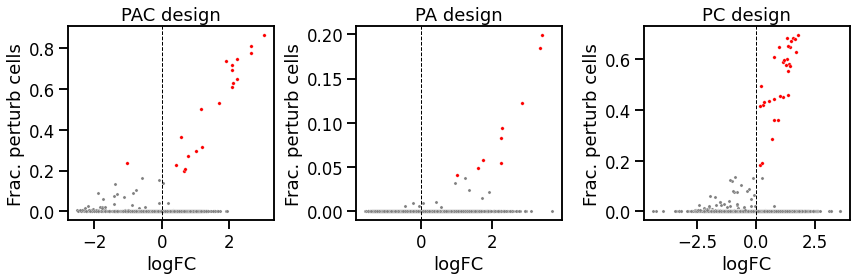

In [31]:
cts = nhood_obs_all.perturb_pop.unique()
for ct in cts:
    nhood_obs = nhood_obs_all[nhood_obs_all.perturb_pop == ct]
    nhood_obs['signif_DA'] = (nhood_obs.SpatialFDR <= 0.1) & (nhood_obs.logFC > 0)
    with rc_context({'figure.figsize':[12,4]}):
        for i,d in enumerate(['PAC', "PA", "PC"]):
            plt.subplot(1,3,i+1)
            sns.scatterplot(data=nhood_obs[nhood_obs.design==d], x='logFC',  y='frac_perturb_cells',  s=10, color='grey');
            sns.scatterplot(data=nhood_obs[(nhood_obs.design==d) & (nhood_obs.is_perturb_nhood)], x='logFC',  y='frac_perturb_cells',  s=12, color='red');
            plt.axvline(x=0, color='black', linewidth=1, linestyle='--'); 
            plt.title(f'{d} design');
            plt.ylabel("Frac. perturb cells");
            plt.tight_layout();
    plt.savefig(figdir + f'N_cells_logFC_{ct}.png');
    plt.show()

In [32]:
%%R -i nhood_obs_all
head(nhood_obs_all)

                                            index_cell kth_distance
1 10_1038_s41591_021_01329_2-BGCV01_CACTCCAGTCCGTCAG-1     1.842600
2 10_1038_s41591_021_01329_2-BGCV01_CCCAATCGTTCGTGAT-1     1.082477
3 10_1038_s41591_021_01329_2-BGCV01_GTCATTTTCGCTGATA-1     1.157062
4 10_1038_s41591_021_01329_2-BGCV01_CTGCCTAAGTAGATGT-1     1.357066
5 10_1038_s41591_021_01329_2-BGCV01_GTAGTCAAGCTGCAAG-1     1.062361
6 10_1038_s41591_021_01329_2-BGCV01_GACGGCTCAAAGGTGC-1     1.049740
     nhood_annotation nhood_annotation_frac      logFC   logCPM           F
1            platelet             0.4367816 -1.0208991 9.036446 1.645807482
2 natural_killer_cell             1.0000000 -0.1466724 9.269045 0.054672784
3 natural_killer_cell             1.0000000  0.8122574 9.342563 1.879559451
4 natural_killer_cell             0.9894737 -0.6271307 9.088889 1.133160279
5 natural_killer_cell             1.0000000  0.1863789 9.529636 0.092124168
6        naive_B_cell             0.8588235 -0.0534535 9.205450 0.00

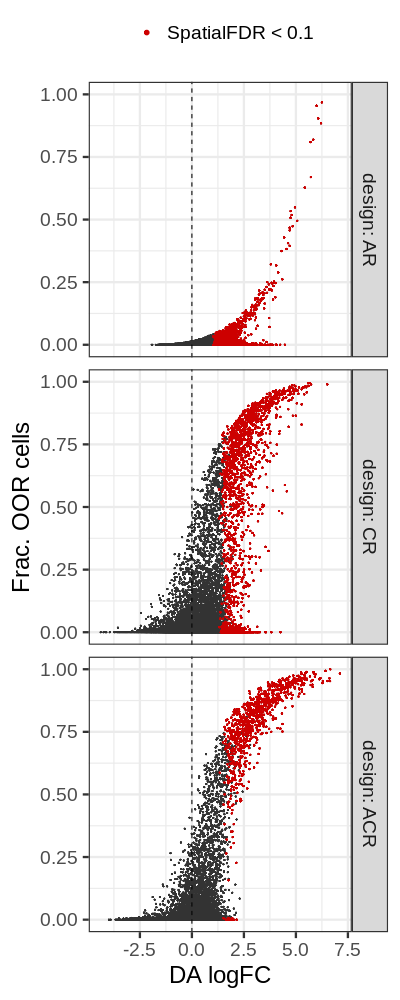

In [44]:
%%R -h 1000 -w 400 -i figdir
library(ggrastr)

nhood_obs_all %>%
mutate(design=factor(design, levels=c('AR', 'CR','ACR'))) %>%
ggplot(aes(logFC, frac_perturb_cells)) +
    rasterise(geom_point(size=0.3, color='grey20'), dpi=300) +
    rasterise(geom_point(data=. %>% filter(signif_DA), aes(color='SpatialFDR < 0.1'),
               size=0.4), dpi=300) +
    facet_grid(design~., labeller='label_both') +
    guides(color=guide_legend(title='', override.aes = list(size=2))) +
    theme_bw(base_size=24) +
    scale_color_manual(values = c(`SpatialFDR < 0.1` = 'red3')) +
    geom_vline(xintercept=0, linetype=2) +
    xlab('DA logFC') + ylab('Frac. OOR cells') +
    theme(legend.position='top') +
    ggsave(paste0(figdir, 'fracVSlogFC_all_ggplot.png'), width=6, height=12) +
    ggsave(paste0(figdir, 'fracVSlogFC_all_ggplot.pdf'), width=6, height=12)

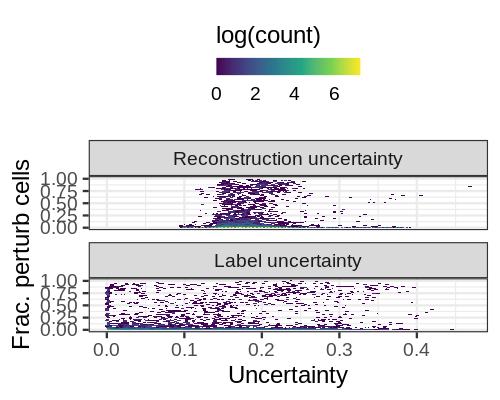

In [329]:
%%R -w 500 -h 400
metric_labels <- c(
  unc_gex = "Reconstruction uncertainty",
  unc_labels = "Label uncertainty"
)

nhood_obs_all %>%
    mutate(design=factor(design, levels=c('PAC', 'PA', "PC"))) %>%
    filter(design == 'PAC') %>%
    mutate(unc_gex = 1 - conf_gex, unc_labels = 1 - conf_labels) %>%
    select(unc_gex, unc_labels, design, frac_perturb_cells) %>%
    pivot_longer(cols=c(unc_gex, unc_labels), names_to='metric') %>%
#     head()
    ggplot(aes(value, frac_perturb_cells)) +
        stat_binhex(aes(fill=log(..count..)), bins=100) +
        facet_wrap(metric~., labeller=labeller(metric = metric_labels), ncol=1) +
        guides(fill=guide_colourbar(barwidth=10, ticks=FALSE, title.position='top')) +
        scale_fill_viridis_c() +
        theme_bw(base_size=24) +
        ylab('Frac. perturb cells') + xlab('Uncertainty') +
        theme(legend.position='top') +
        ggsave(paste0(figdir, 'fracVSunc_all_ggplot.png'), width=6, height=14) +
        ggsave(paste0(figdir, 'fracVSunc_all_ggplot.pdf'), width=6, height=14)

# # p2 <- nhood_obs_all %>%
# #     mutate(design=factor(design, levels=c('PAC', 'PA', "PC"))) %>%
# #     filter(design == 'PAC') %>%
# #     ggplot(aes(1 - conf_labels, frac_perturb_cells)) +
# #         stat_binhex(aes(fill=log(..count..)), bins=100) +
# #         facet_wrap(design~., labeller='label_both') +
# #         guides(fill=guide_colourbar(barwidth=10, ticks=FALSE, title.position='top')) +
# #         scale_fill_viridis_c() +
# #         theme_bw(base_size=24) +
# #         ylab('Frac. perturb cells') + xlab('Label uncertainty') +
# #         theme(legend.position='top') 

# (p1 / p2) + plot_layout(guides='collect')

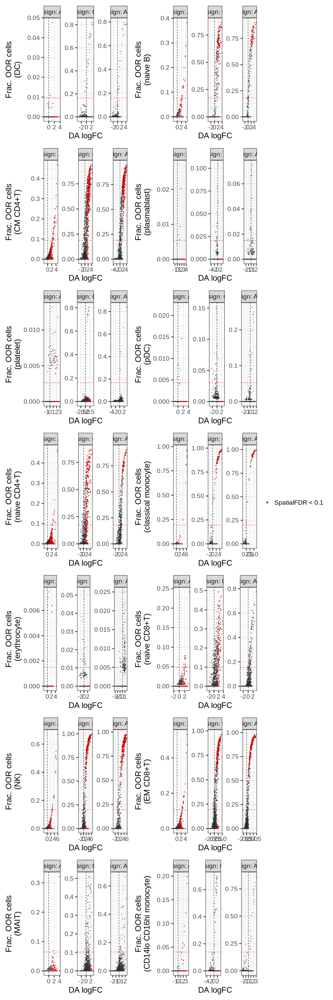

In [45]:
%%R -w 1000 -h 3000
pl_ls <- lapply(unique(nhood_obs_all$perturb_pop_pl), function(p){
    nhood_obs_all %>%
    mutate(design=factor(design, levels=c("AR", 'CR', "ACR"))) %>%
    group_by(perturb_pop_pl, design) %>%
    mutate(frac_thresh= max(frac_perturb_cells/100)*20) %>%
    ungroup() %>%
    filter(perturb_pop_pl %in% c(p)) %>%
    ggplot(aes(logFC, frac_perturb_cells)) +
        geom_point(size=0.4, color='grey20') +
        geom_point(data=. %>% filter(signif_DA), aes(color='SpatialFDR < 0.1'), size=0.6) +
        facet_wrap(design~., labeller=label_both, scales='free') +
        guides(color=guide_legend(title='', override.aes = list(size=2))) +
        theme_bw(base_size=24) +
        scale_color_manual(values = c(`SpatialFDR < 0.1` = 'red3')) +
        geom_vline(xintercept=0, linetype=2) +
        geom_hline(aes(yintercept=frac_thresh), linetype=2, color='red') +
        xlab('DA logFC') + ylab(glue::glue('Frac. OOR cells\n({p})')) +
#         ggtitle(glue::glue('Perturb-specific population: {p}')) +
        theme(legend.position='top') 
    })

(wrap_plots(pl_ls, ncol=2, guides='collect') & {theme(legend.position='right') }) +
    ggsave(paste0(figdir, 'fracVSlogFC_cts_ggplot.png'), width=24, height=32) +
    ggsave(paste0(figdir, 'fracVSlogFC_cts_ggplot.pdf'), width=24, height=32)


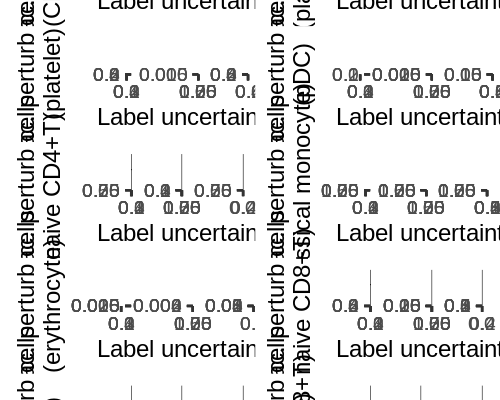

In [336]:
%%R -w 500 -h 400
pl_ls <- lapply(unique(nhood_obs_all$perturb_pop_pl), function(p){
    nhood_obs_all %>%
    mutate(design=factor(design, levels=c('PAC', 'PA', "PC"))) %>%
    group_by(perturb_pop_pl, design) %>%
    mutate(frac_thresh= max(frac_perturb_cells/100)*20) %>%
    ungroup() %>%
    filter(perturb_pop_pl %in% c(p)) %>%
    mutate(unc_gex = 1 - conf_gex, unc_labels = 1 - conf_labels) %>%
#     select(unc_gex, unc_labels, design, frac_perturb_cells, perturb_pop_pl, design, frac_thresh) %>%
#     pivot_longer(cols=c(unc_gex, unc_labels), names_to='metric') %>%
    ggplot(aes(unc_gex, frac_perturb_cells)) +
    stat_binhex(aes(fill=log(..count..)), bins=50) +
    facet_wrap(design~., scales='free',
               labeller=label_both) +
#         facet_wrap(design~., labeller=label_both, scales='free') +
    scale_fill_viridis_c() +    
    guides(fill='none') +
        theme_bw(base_size=24) +
        geom_vline(xintercept=0, linetype=2) +
        geom_hline(aes(yintercept=frac_thresh), linetype=2, color='red') +
        xlab('Reconstruction uncertainty') + ylab(glue::glue('Frac. perturb cells\n({p})')) +
#         ggtitle(glue::glue('Perturb-specific population: {p}')) +
        theme(legend.position='top') 
    })

(wrap_plots(pl_ls, ncol=2, guides='collect') & {theme(legend.position='right') }) +
    ggsave(paste0(figdir, 'fracVSunc_gex_cts_ggplot.png'), width=24, height=32) +
    ggsave(paste0(figdir, 'fracVSunc_gex_cts_ggplot.pdf'), width=24, height=32)
    
pl_ls <- lapply(unique(nhood_obs_all$perturb_pop_pl), function(p){
    nhood_obs_all %>%
    mutate(design=factor(design, levels=c('PAC', 'PA', "PC"))) %>%
    group_by(perturb_pop_pl, design) %>%
    mutate(frac_thresh= max(frac_perturb_cells/100)*20) %>%
    ungroup() %>%
    filter(perturb_pop_pl %in% c(p)) %>%
    mutate(unc_gex = 1 - conf_gex, unc_labels = 1 - conf_labels) %>%
    ggplot(aes(unc_labels, frac_perturb_cells)) +
    stat_binhex(aes(fill=log(..count..)), bins=50) +
    facet_wrap(design~., scales='free',
               labeller=label_both) +
    scale_fill_viridis_c() +    
    guides(fill='none') +
        theme_bw(base_size=24) +
        geom_vline(xintercept=0, linetype=2) +
        geom_hline(aes(yintercept=frac_thresh), linetype=2, color='red') +
        xlab('Label uncertainty') + ylab(glue::glue('Frac. perturb cells\n({p})')) +
#         ggtitle(glue::glue('Perturb-specific population: {p}')) +
        theme(legend.position='top') 
    })

(wrap_plots(pl_ls, ncol=2, guides='collect') & {theme(legend.position='right') }) +
    ggsave(paste0(figdir, 'fracVSunc_labels_cts_ggplot.png'), width=24, height=32) +
    ggsave(paste0(figdir, 'fracVSunc_labels_cts_ggplot.pdf'), width=24, height=32)



### Precision-Recall

In [50]:
from sklearn.metrics import roc_curve,auc
def _compute_metric_AUPRC(out_df_full, metric):
    from sklearn.metrics import roc_curve,auc, precision_recall_curve
    AUPRC_df_all = pd.DataFrame()
    for i,c in enumerate(out_df_full['perturb_pop'].unique()):
        out_df = out_df_full[out_df_full['perturb_pop'] == c]
        precision, recall, _ = precision_recall_curve(out_df.is_perturb_nhood, out_df[metric])
        no_skill = sum(out_df.is_perturb_nhood) / out_df.shape[0]
        AUC = auc(recall, precision)
        AUPRC_df = pd.DataFrame(np.vstack([recall, precision]), index=['Recall','Precision']).T
        AUPRC_df['AUPRC'] = AUC
        AUPRC_df['perturb_pop'] = c
        AUPRC_df['no_skill_thresh'] = no_skill
        AUPRC_df_all = pd.concat([AUPRC_df_all, AUPRC_df])
    AUPRC_df_all['metric'] = metric
    return(AUPRC_df_all)

nhood_obs_all['unc_gex'] = 1 - nhood_obs_all['conf_gex']
nhood_obs_all['unc_labels'] = 1 - nhood_obs_all['conf_labels']
AUPRC_df_all = pd.DataFrame()
for d in ['AR', "CR", "ACR"]:
    AUPRC_conf_gex_df = _compute_metric_AUPRC(nhood_obs_all[nhood_obs_all.design == d].dropna(), 'unc_gex')
    AUPRC_conf_labels_df = _compute_metric_AUPRC(nhood_obs_all[nhood_obs_all.design == d].dropna(), 'unc_labels')
    AUPRC_logFC_df = _compute_metric_AUPRC(nhood_obs_all[nhood_obs_all.design == d].dropna(), 'logFC')
    AUPRC_df = pd.concat([AUPRC_logFC_df, AUPRC_conf_labels_df, AUPRC_conf_gex_df])
    AUPRC_df['design'] = d
    AUPRC_df_all = pd.concat([AUPRC_df_all, AUPRC_df])

In [51]:
AUPRC_df_all['perturb_pop_pl'] = [short_pop_names[x] for x in AUPRC_df_all['perturb_pop']]

In [52]:
%%R -i AUPRC_df_all
unique(AUPRC_df_all$perturb_pop_pl)

 [1] "DC"                     "naive B"                "CM CD4+T"              
 [4] "plasmablast"            "platelet"               "pDC"                   
 [7] "naive CD4+T"            "classical monocyte"     "erythrocyte"           
[10] "naive CD8+T"            "NK"                     "EM CD8+T"              
[13] "MAIT"                   "CD14lo CD16hi monocyte"


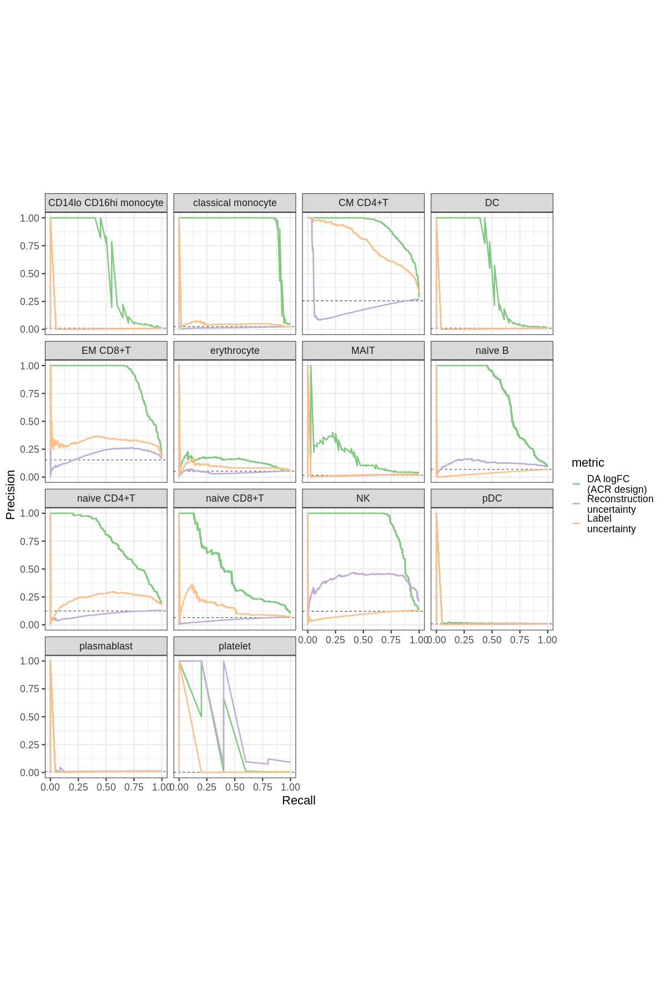

In [67]:
%%R -i figdir -w 1200 -h 1800
AUPRC_df_all %>%
    filter(design=='ACR') %>%
    ggplot(aes( Recall, Precision, group=metric, color=metric)) +
        geom_hline(aes(yintercept=no_skill_thresh), linetype=2, color='grey20') +
        geom_line(size=1.2) +
        facet_wrap(perturb_pop_pl~.) +
        scale_color_brewer(palette='Accent', 
                           labels=setNames(c('Reconstruction\nuncertainty', 'Label\nuncertainty', 'DA logFC\n(ACR design)'), c('unc_gex', 'unc_labels', 'logFC'))) +
        theme_bw(base_size=22) +
        coord_fixed() +
        ggsave(paste0(figdir, 'AUPRC_ACR_vs_uncertainty_curves.png'), width=16, height=16)

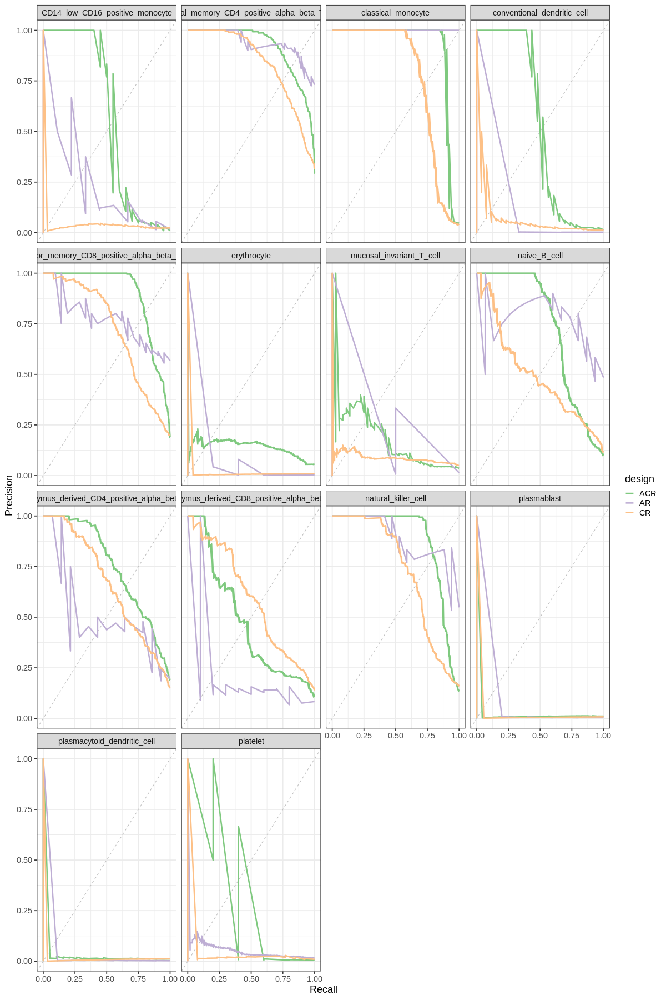

In [68]:
%%R -i figdir -w 1200 -h 1800
AUPRC_df_all %>%
    filter(metric=='logFC') %>%
    ggplot(aes( Recall, Precision, group=design, color=design)) +
        geom_abline(linetype=2, color='grey') +
        geom_line(size=1.2) +
        facet_wrap(perturb_pop~.) +
        scale_color_brewer(palette='Accent', labels=setNames(c('GEX uncertainty', 'Label\nuncertainty', 'DA logFC'), c('unc_gex', 'unc_labels', 'logFC'))) +
        theme_bw(base_size=18) 

In [106]:
%%R -i figdir -w 1500 -h 800
pl_ls <- lapply(c("AR", "CR", "ACR"), function(d){
    AUPRC_df_all %>%
        filter(design == d) %>%
        filter(!is.na(AUPRC)) %>%
        ggplot(aes( design, AUPRC, fill=metric)) +
        geom_col(position='dodge') +
        geom_hline(aes(yintercept=no_skill_thresh), linetype=2, color='grey20') +
            scale_fill_brewer(palette='Accent', 
                               labels=setNames(c('Reconstruction\nuncertainty', 'Label\nuncertainty', 'DA logFC'), c('unc_gex', 'unc_labels', 'logFC'))) +
            guides(fill=guide_legend(title.position='top')) +
            theme_bw(base_size=20) +
            facet_wrap(perturb_pop_pl~., scales='free', nrow=3) +
            coord_flip() +
            ylab('AUPRC') +
            theme(axis.text.y=element_blank(), 
                  axis.ticks.y=element_blank(),
                  axis.text.x=element_text(angle=45, hjust=1, vjust=1), 
                  legend.position='top', legend.justification='right') 
    })

wrap_plots(pl_ls[[2]]) +
plot_layout(ncol=1, guides='collect') &
theme(legend.position='top', legend.justification='right')
        ggsave(paste0(figdir, 'AUPRC_ACR_vs_uncertainty_barplots.png'), width=15, height=10) +
        ggsave(paste0(figdir, 'AUPRC_ACR_vs_uncertainty_barplots.pdf'), width=15, height=10)



integer(0)


`summarise()` has grouped output by 'design', 'metric'. You can override using the `.groups` argument.


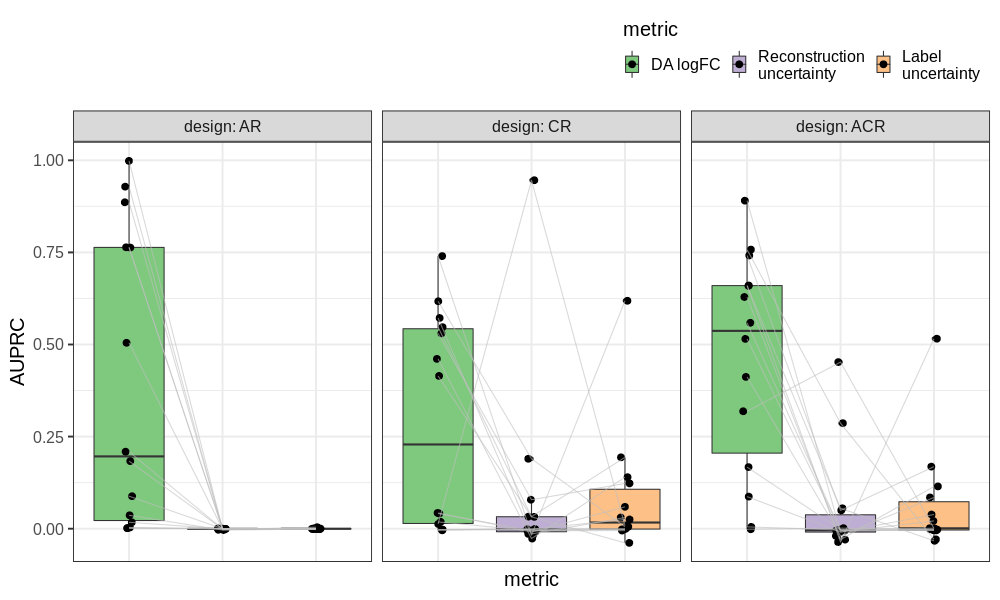

In [107]:
%%R -i figdir -w 1000 -h 600
AUPRC_df_all %>%
    filter(!is.na(AUPRC)) %>%
    mutate(design = factor(design, levels=c("AR", "CR", "ACR"))) %>%
    group_by(design, metric, perturb_pop) %>%
    summarise(AUPRC=mean(AUPRC), no_skill_thresh=mean(no_skill_thresh)) %>%
    ggplot(aes( metric, AUPRC - no_skill_thresh, fill=metric)) +
    geom_boxplot() +
    geom_jitter(size=3, width=0.05) +
    geom_line(aes(group=perturb_pop), color='grey', alpha=0.6) +
        scale_fill_brewer(palette='Accent', 
                           labels=setNames(c('Reconstruction\nuncertainty', 'Label\nuncertainty', 'DA logFC'), c('unc_gex', 'unc_labels', 'logFC'))) +
        guides(fill=guide_legend(title.position='top')) +
        theme_bw(base_size=20) +
        facet_wrap(design~., scales='free_x', nrow=1, labeller='label_both') +
        ylab('AUPRC') +
        theme(axis.text.x=element_blank(), 
                  axis.ticks.x=element_blank(),
#                   axis.text.y=element_text(angle=45, hjust=1, vjust=1), 
                  legend.position='top', legend.justification='right') +
    ggsave(paste0(figdir, 'AUPRC_vs_uncertainty_boxplot.png'), width=12, height=5) +
    ggsave(paste0(figdir, 'AUPRC_vs_uncertainty_boxplot.pdf'), width=12, height=5)


### TPR/FPR
Using significance

In [109]:
cts = nhood_obs_all.perturb_pop.unique()
alpha = 0.1
nhood_obs_all['pred_positive'] = (nhood_obs_all.SpatialFDR < alpha) & (nhood_obs_all.logFC > 0)
nhood_obs_all['TP'] = nhood_obs_all['pred_positive'] & (nhood_obs_all['is_perturb_nhood']) & (nhood_obs_all.logFC > 0)
nhood_obs_all['FP'] = nhood_obs_all['pred_positive'] & (~nhood_obs_all['is_perturb_nhood'])
nhood_obs_all['FN'] = (~nhood_obs_all['pred_positive']) & (nhood_obs_all['is_perturb_nhood'])
nhood_obs_all['TN'] = (~nhood_obs_all['pred_positive']) & (~nhood_obs_all['is_perturb_nhood'])

tpr_df = nhood_obs_all.groupby(['design', 'perturb_pop']).sum()[['TP', 'FP', 'FN', "TN"]].reset_index()
tpr_df['TPR'] = tpr_df['TP'] / (tpr_df['TP'] + tpr_df['FN'])
tpr_df['FPR'] = tpr_df['FP'] / (tpr_df['FP'] + tpr_df['TN'])
tpr_df['FDR'] = tpr_df['FP'] / (tpr_df['FP'] + tpr_df['TP'])
tpr_df.loc[tpr_df['FDR'].isna(), 'FDR'] = 0
tpr_df['design'] = tpr_df['design'].astype('category').cat.reorder_categories(['AR', "CR", 'ACR'])
tpr_df

,design,perturb_pop,TP,FP,FN,TN,TPR,FPR,FDR
0,ACR,CD14_low_CD16_positive_monocyte,0,0,20,2042,0.000000,0.000000,0.000000
1,ACR,central_memory_CD4_positive_alpha_beta_T_cell,263,3,259,1509,0.503831,0.001984,0.011278
2,ACR,classical_monocyte,46,0,8,2048,0.851852,0.000000,0.000000
3,ACR,conventional_dendritic_cell,3,0,20,2196,0.130435,0.000000,0.000000
4,ACR,effector_memory_CD8_positive_alpha_beta_T_cell,202,0,118,1738,0.631250,0.000000,0.000000
5,ACR,erythrocyte,0,0,114,2045,0.000000,0.000000,0.000000
6,ACR,mucosal_invariant_T_cell,0,0,36,2123,0.000000,0.000000,0.000000
7,ACR,naive_B_cell,64,0,82,1970,0.438356,0.000000,0.000000
8,ACR,naive_thymus_derived_CD4_positive_alpha_beta_T...,60,0,195,1808,0.235294,0.000000,0.000000
9,ACR,naive_thymus_derived_CD8_positive_alpha_beta_T...,3,0,130,1924,0.022556,0.000000,0.000000


In [252]:
# with rc_context({'figure.figsize':[10,4]}):
#     plt.subplot(1,3,1)
#     sns.stripplot(data=tpr_df, y='TPR', x='design', s=10);
#     plt.ylim(-0.1,1.1);
#     plt.subplot(1,3,2)
#     sns.stripplot(data=tpr_df, y='FDR', x='design', s=10);
#     plt.ylim(-0.1,1.1);
#     plt.subplot(1,3,3)
#     sns.stripplot(data=tpr_df, y='FPR', x='design', s=10);
#     plt.ylim(-0.1,1.1);
#     plt.tight_layout()
#     plt.savefig(figdir+'TPR_FDR_TPR.png')

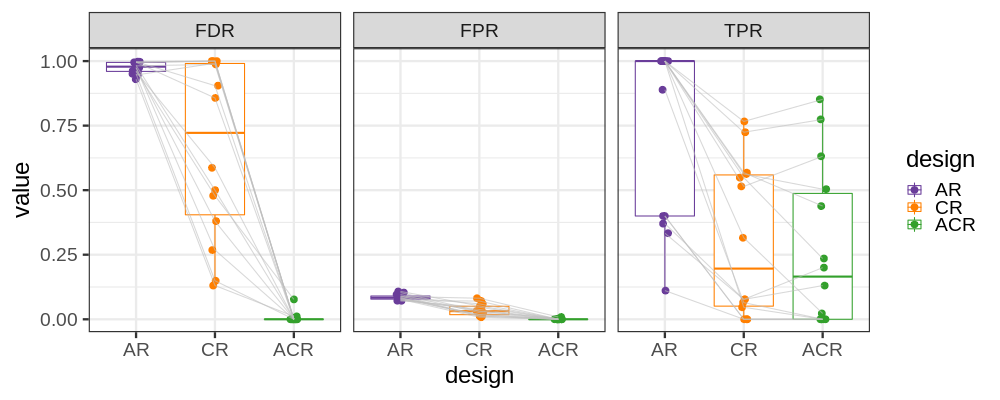

In [112]:
%%R -i tpr_df -w 1000 -h 400 -i design_palette_df

design_palette = setNames(design_palette_df$color, rownames(design_palette_df))

pl1 <- tpr_df %>%
    mutate(design = factor(design, levels=c('AR', "CR", 'ACR'))) %>%
    pivot_longer(cols=c("TPR", "FPR", "FDR"), names_to='metric') %>%
    ggplot(aes(design, value, color=design)) +
    geom_boxplot() +
    geom_jitter(size=3, width=0.05) +
    geom_line(aes(group=perturb_pop), color='grey', alpha=0.6) +
    facet_wrap(metric~.) +
    scale_color_manual(values=design_palette) +
    theme_bw(base_size=24)
pl1 

`summarise()` has grouped output by 'design', 'metric'. You can override using the `.groups` argument.


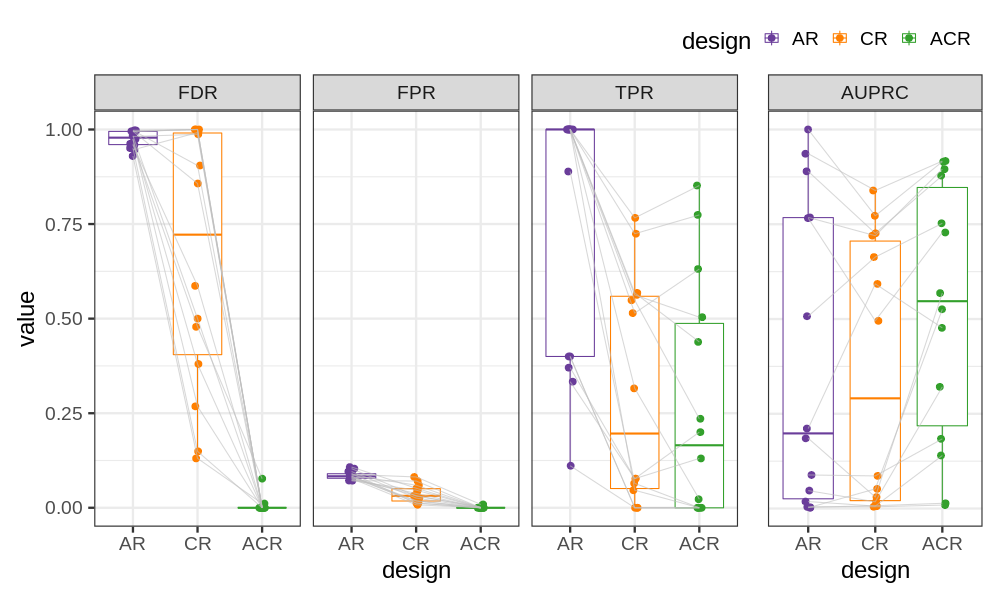

In [114]:
%%R -i figdir -w 1000 -h 600
pl2 <- AUPRC_df_all %>%
    filter(metric=='logFC') %>%
    group_by(design, metric, perturb_pop) %>%
    summarise(AUPRC=mean(AUPRC), no_skill_thresh=mean(no_skill_thresh)) %>%
    mutate(facet_name = 'AUPRC') %>%
    mutate(design = factor(design, levels=c('AR', "CR", 'ACR'))) %>%
    ggplot(aes(design,  AUPRC, color=design)) +
    geom_boxplot() +
    geom_jitter(size=3, width=0.05) +
    geom_line(aes(group=perturb_pop), color='grey', alpha=0.6) +
    ylab('value') +
    facet_wrap(facet_name~.) +
        scale_color_manual(values=design_palette) +
    theme_bw(base_size=24) +
    remove_y_axis()
    
fig <- (pl1 + pl2) + plot_layout(widths=c(3,1), guides='collect') & 
    {theme(legend.position='top', legend.justification='right')} 

fig +
    ggsave(paste0(figdir, 'metrics_boxplot_design.png'), width=12, height=5) +
    ggsave(paste0(figdir, 'metrics_boxplot_design.pdf'), width=12, height=5)

## Uncertainty delta in PAC across simulations

In [343]:
def add_nhood_uncertainties(pac_design_adata, query_group, ctrl_group):
    pac_design_adata.obs['conf_labels'] = 1 - pac_design_adata.obs['uncertainty_labels']
    pac_design_adata.obs['conf_gex'] = 1 - pac_design_adata.obs['uncertainty_gex']
#     pac_design_adata.obs['conf_z'] = 1 - pac_design_adata.obs['uncertainty_z']

    for c in ['conf_gex', 'conf_labels']:
        get_nhood_adata(pac_design_adata).obs[c + '_query'] = get_mean_confidence_x_nhood(
            pac_design_adata, 
            obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] == query_group], confidence_col=c)
        get_nhood_adata(pac_design_adata).obs[c + '_ctrl'] = get_mean_confidence_x_nhood(
            pac_design_adata, 
            obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] == ctrl_group], confidence_col=c)

nhood_obs_all_unc = pd.DataFrame()
for d in [x for x in os.listdir(outdir) if not x.endswith('.h5ad') and x.startswith('qPBMC')][1:]:
    perturb_pop = d.split(population_obs)[1].split('_queryBatch')[0]
    print(f'Reading {perturb_pop}\n')
    pac_design_adata = milopy.utils.read_milo_adata(outdir + d + '/pac_design.h5ad', backed=True)
    
    ### Define true positive neighbourhoods
    _add_perturb_pop_info(pac_design_adata)
    
    # ## Calculate avg confidence per nhood
    print(f'Calculating avg confidence')
    add_nhood_uncertainties(pac_design_adata, query_group='query', ctrl_group='ctrl')
    
    ## Store nhood info
    nhood_obs = get_nhood_adata(pac_design_adata).obs.copy()
    nhood_obs['perturb_pop'] = perturb_pop
    nhood_obs_all_unc = pd.concat([nhood_obs_all_unc, nhood_obs])

Reading conventional_dendritic_cell

Calculating avg confidence
Reading naive_B_cell

Calculating avg confidence
Reading central_memory_CD4_positive_alpha_beta_T_cell

Calculating avg confidence
Reading plasmablast

Calculating avg confidence
Reading platelet

Calculating avg confidence
Reading plasmacytoid_dendritic_cell

Calculating avg confidence
Reading naive_thymus_derived_CD4_positive_alpha_beta_T_cell

Calculating avg confidence
Reading classical_monocyte

Calculating avg confidence
Reading erythrocyte



/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


Calculating avg confidence
Reading naive_thymus_derived_CD8_positive_alpha_beta_T_cell

Calculating avg confidence
Reading natural_killer_cell

Calculating avg confidence
Reading effector_memory_CD8_positive_alpha_beta_T_cell

Calculating avg confidence
Reading mucosal_invariant_T_cell

Calculating avg confidence
Reading CD14_low_CD16_positive_monocyte



OSError: [Errno 5] Can't read data (file read failed: time = Fri Aug 19 10:02:49 2022
, filename = '/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/qPBMC_500cells_demo_perturb_cell_typeCD14_low_CD16_positive_monocyte_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022/pac_design.h5ad', file descriptor = 109, errno = 5, error message = 'Input/output error', buf = 0x557dcd22cb80, total read size = 557560, bytes this sub-read = 557560, bytes actually read = 18446744073709551615, offset = 0)

In [344]:
%%R -i nhood_obs_all_unc
colnames(nhood_obs_all_unc)

 [1] "index_cell"            "kth_distance"          "nhood_annotation"     
 [4] "nhood_annotation_frac" "logFC"                 "logCPM"               
 [7] "F"                     "PValue"                "FDR"                  
[10] "SpatialFDR"            "is_perturb_nhood"      "n_perturb_cells"      
[13] "n_cells"               "frac_perturb_cells"    "conf_gex_query"       
[16] "conf_gex_ctrl"         "conf_labels_query"     "conf_labels_ctrl"     
[19] "perturb_pop"          


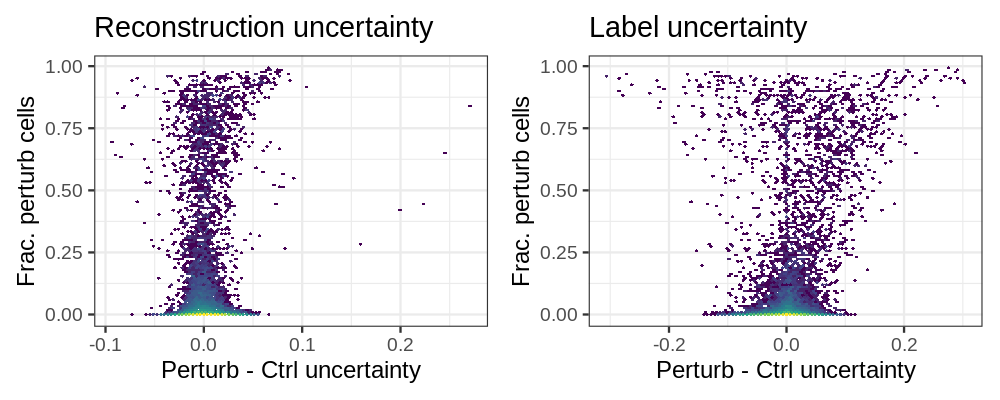

In [367]:
%%R -w 1000 -h 400
p1 <- nhood_obs_all_unc %>%
arrange(n_perturb_cells) %>%
filter(conf_gex_ctrl > 0) %>%
mutate(unc_gex_query= 1 - conf_gex_query, unc_gex_ctrl=1-conf_gex_ctrl) %>%
ggplot(aes(unc_gex_query - unc_gex_ctrl, frac_perturb_cells)) +
    scale_color_viridis_c(option='magma') +
    theme_bw(base_size=16) +
        stat_binhex(aes(fill=log(..count..)), bins=100) +
        guides(fill=guide_colourbar(barwidth=10, ticks=FALSE, title.position='top')) +
        scale_fill_viridis_c() +
        theme_bw(base_size=24) +
        ylab('Frac. perturb cells') + xlab('Perturb - Ctrl uncertainty') +
        theme(legend.position='none') +
        ggtitle("Reconstruction uncertainty")
#         ggsave(paste0(figdir, 'fracVSunc_all_ggplot.png'), width=6, height=14) +
#         ggsave(paste0(figdir, 'fracVSunc_all_ggplot.pdf'), width=6, height=14)

p2 <- nhood_obs_all_unc %>%
arrange(n_perturb_cells) %>%
filter(conf_labels_ctrl > 0) %>%
mutate(unc_labels_query= 1 - conf_labels_query, unc_labels_ctrl=1-conf_labels_ctrl) %>%
ggplot(aes(unc_labels_query - unc_labels_ctrl, frac_perturb_cells)) +
    scale_color_viridis_c(option='magma') +
    theme_bw(base_size=16) +
        stat_binhex(aes(fill=log(..count..)), bins=100) +
        guides(fill=guide_colourbar(barwidth=10, ticks=FALSE, title.position='top')) +
        scale_fill_viridis_c() +
        theme_bw(base_size=24) +
        ylab('Frac. perturb cells') + xlab('Perturb - Ctrl uncertainty') +
        theme(legend.position='none') +
        ggtitle("Label uncertainty")

(p1 + p2) + 
        ggsave(paste0(figdir, 'fracVSuncDelta_all_ggplot.png'), width=14, height=6) +
        ggsave(paste0(figdir, 'fracVSuncDelta_all_ggplot.pdf'), width=14, height=6)

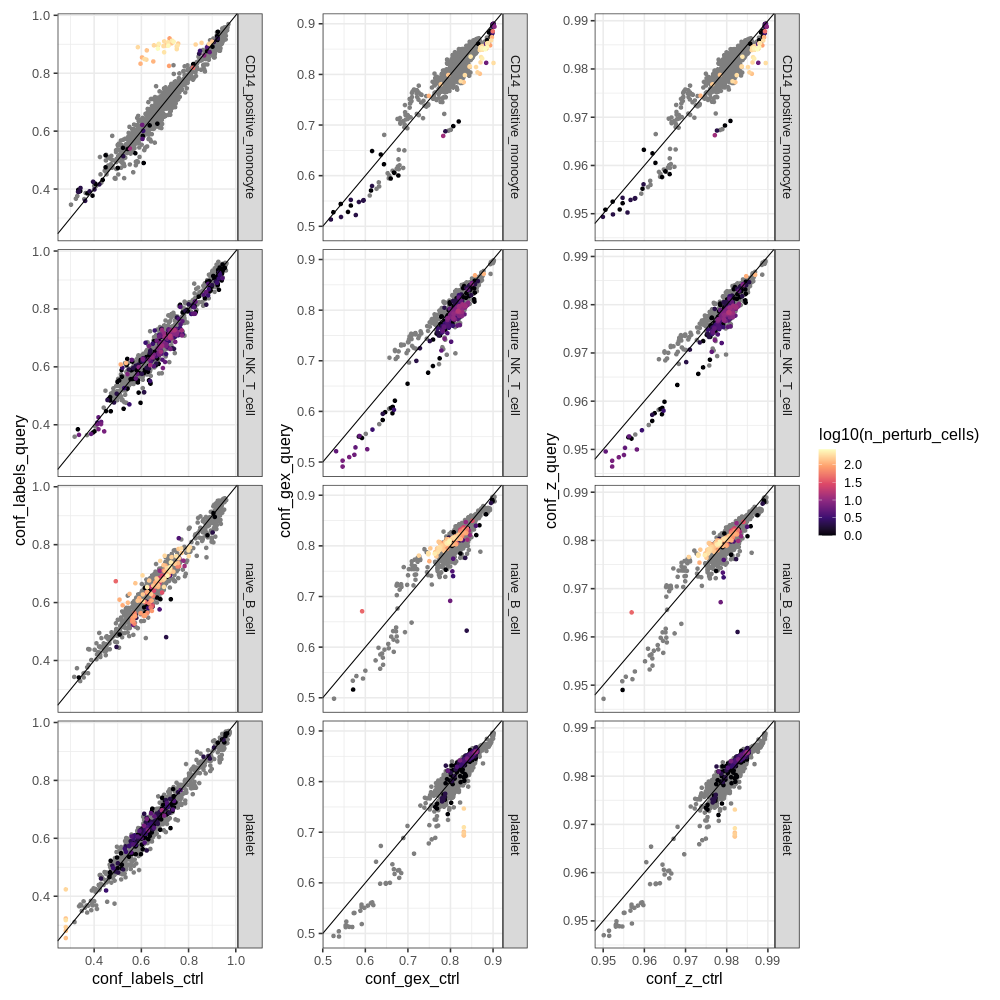

In [153]:
%%R -w 1000 -h 1000

nhood_obs_all_unc %>%
arrange(n_perturb_cells) %>%
filter(conf_labels_ctrl > 0) %>%
ggplot(aes(conf_labels_ctrl, conf_labels_query, color=log10(n_perturb_cells))) +
    geom_point() +
    geom_abline() +
    scale_color_viridis_c(option='magma') +
    facet_grid(perturb_pop~.) +
    theme_bw(base_size=16) +

nhood_obs_all_unc %>%
arrange(n_perturb_cells) %>%
filter(conf_gex_ctrl > 0) %>%
ggplot(aes(conf_gex_ctrl, conf_gex_query, color=log10(n_perturb_cells))) +
    geom_point() +
    geom_abline() +
    scale_color_viridis_c(option='magma') +
    facet_grid(perturb_pop~.) +
    theme_bw(base_size=16) +


nhood_obs_all_unc %>%
arrange(n_perturb_cells) %>%
filter(conf_z_ctrl > 0) %>%
ggplot(aes(conf_z_ctrl, conf_z_query, color=log10(n_perturb_cells))) +
    geom_point() +
    geom_abline() +
    scale_color_viridis_c(option='magma') +
    facet_grid(perturb_pop~.) +
    theme_bw(base_size=16) +
plot_layout(guides='collect') +
ggsave(paste0(figdir, 'confidence_delta_scatter.png'), height=15, width=18)

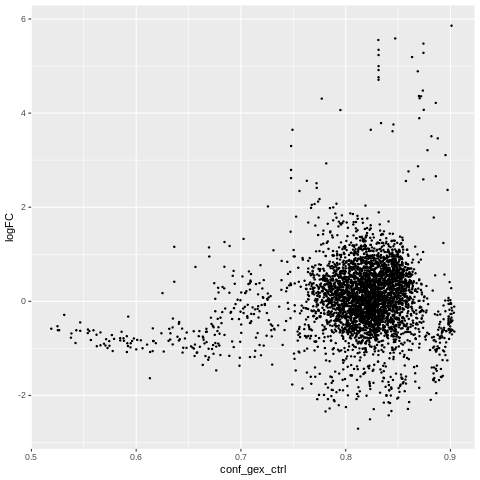

In [172]:
%%R 
nhood_obs_all_unc %>%
filter(conf_gex_ctrl > 0) %>%
ggplot(aes(conf_gex_ctrl, logFC)) +
geom_point(size=0.5) 